# Projet 6
# Classifiez automatiquement des biens de consommation



## Problématique

- Etudier la faisabilité d'un moteur de classification basée sur une image et une description

## Missions

- Réaliser un prétraitement des données visuelles et textuelles;
- Classifier les différents articles

## Compétences évaluées

- Prétraiter des données image pour obtenir un jeu de données exploitable
- Prétraiter des données texte pour obtenir un jeu de données exploitable
- Représenter graphiquement des données à grandes dimensions
- Mettre en œuvre des techniques de réduction de dimension

In [1]:
%matplotlib inline

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats

pd.options.display.max_rows = 100
plt.rcParams["figure.figsize"]=20,20
sns.set_style("white")

## 1. Lecture et préparation des données

In [2]:
data0 = pd.read_csv('data/flipkart_com-ecommerce_sample_1050.csv')

In [3]:
data0.head()

,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications
0,55b85ea15a1536d46b7190ad6fff8ce7,2016-04-30 03:22:56 +0000,http://www.flipkart.com/elegance-polyester-mul...,Elegance Polyester Multicolor Abstract Eyelet ...,"[""Home Furnishing >> Curtains & Accessories >>...",CRNEG7BKMFFYHQ8Z,1899.0,899.0,55b85ea15a1536d46b7190ad6fff8ce7.jpg,False,Key Features of Elegance Polyester Multicolor ...,No rating available,No rating available,Elegance,"{""product_specification""=>[{""key""=>""Brand"", ""v..."
1,7b72c92c2f6c40268628ec5f14c6d590,2016-04-30 03:22:56 +0000,http://www.flipkart.com/sathiyas-cotton-bath-t...,Sathiyas Cotton Bath Towel,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",BTWEGFZHGBXPHZUH,600.0,449.0,7b72c92c2f6c40268628ec5f14c6d590.jpg,False,Specifications of Sathiyas Cotton Bath Towel (...,No rating available,No rating available,Sathiyas,"{""product_specification""=>[{""key""=>""Machine Wa..."
2,64d5d4a258243731dc7bbb1eef49ad74,2016-04-30 03:22:56 +0000,http://www.flipkart.com/eurospa-cotton-terry-f...,Eurospa Cotton Terry Face Towel Set,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",BTWEG6SHXTDB2A2Y,NaN,NaN,64d5d4a258243731dc7bbb1eef49ad74.jpg,False,Key Features of Eurospa Cotton Terry Face Towe...,No rating available,No rating available,Eurospa,"{""product_specification""=>[{""key""=>""Material"",..."
3,d4684dcdc759dd9cdf41504698d737d8,2016-06-20 08:49:52 +0000,http://www.flipkart.com/santosh-royal-fashion-...,SANTOSH ROYAL FASHION Cotton Printed King size...,"[""Home Furnishing >> Bed Linen >> Bedsheets >>...",BDSEJT9UQWHDUBH4,2699.0,1299.0,d4684dcdc759dd9cdf41504698d737d8.jpg,False,Key Features of SANTOSH ROYAL FASHION Cotton P...,No rating available,No rating available,SANTOSH ROYAL FASHION,"{""product_specification""=>[{""key""=>""Brand"", ""v..."
4,6325b6870c54cd47be6ebfbffa620ec7,2016-06-20 08:49:52 +0000,http://www.flipkart.com/jaipur-print-cotton-fl...,Jaipur Print Cotton Floral King sized Double B...,"[""Home Furnishing >> Bed Linen >> Bedsheets >>...",BDSEJTHNGWVGWWQU,2599.0,698.0,6325b6870c54cd47be6ebfbffa620ec7.jpg,False,Key Features of Jaipur Print Cotton Floral Kin...,No rating available,No rating available,Jaipur Print,"{""product_specification""=>[{""key""=>""Machine Wa..."


In [4]:
data0.isna().sum()

uniq_id                      0
crawl_timestamp              0
product_url                  0
product_name                 0
product_category_tree        0
pid                          0
retail_price                 1
discounted_price             1
image                        0
is_FK_Advantage_product      0
description                  0
product_rating               0
overall_rating               0
brand                      338
product_specifications       1
dtype: int64

In [5]:
data0.shape

(1050, 15)

Pour les besoins de la classification, nous allons dans un premier temps spliter la colonne "product_category_tree". Pour cela, analysons la profondeur de l'arbre des catégories.

C:\ProgramData\Anaconda3\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


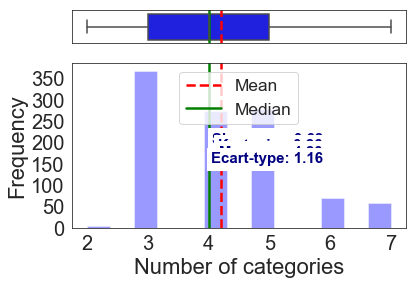

In [6]:
length_cat_split = []

for ii in data0['product_category_tree']:
    strings = ii.split('["')[1].split('"]')[0].split('>>')
    length_cat_split.append(len(strings))

length_cat_split = pd.DataFrame({'length':length_cat_split})

dataMean = length_cat_split.mean()
dataMedian = length_cat_split.median()
    
fig, (ax_box, ax_hist) = plt.subplots(2, sharex=True, gridspec_kw= {"height_ratios": (0.2, 1)})
    
sns.boxplot(length_cat_split.values,color="blue",ax=ax_box)
ax_box.axvline(float(dataMean),color='r', linestyle='--',linewidth=2.5)
ax_box.axvline(float(dataMedian), color='g', linestyle='-',linewidth=2.5)
ax_box.set_xlabel("")
ax_box.set_ylabel("")
        
xx = 0.75
location = 'upper center'
        
sns.distplot(length_cat_split.values,kde=False,color="blue",ax=ax_hist)

ax_hist.text(x=xx, y=0.58, transform=ax_hist.transAxes, s="Skewness: %.2f" % length_cat_split['length'].skew(),\
             fontweight='demibold', fontsize=15, verticalalignment='top', horizontalalignment='right',\
             backgroundcolor='white', color='navy')
ax_hist.text(x=xx, y=0.54, transform=ax_hist.transAxes, s="Kurtosis: %.2f" % length_cat_split['length'].kurt(),\
             fontweight='demibold', fontsize=15, verticalalignment='top', horizontalalignment='right',\
             backgroundcolor='white', color='navy')
ax_hist.text(x=xx, y=0.50, transform=ax_hist.transAxes, s="Moyenne: %.2f" % length_cat_split['length'].mean(),\
             fontweight='demibold', fontsize=15, verticalalignment='top', horizontalalignment='right',\
             backgroundcolor='white', color='navy')
ax_hist.text(x=xx, y=0.46, transform=ax_hist.transAxes, s="Ecart-type: %.2f" % length_cat_split['length'].std(),\
             fontweight='demibold', fontsize=15, verticalalignment='top', horizontalalignment='right',\
             backgroundcolor='white', color='navy')

yMinMax = ax_hist.get_ylim()
    
ax_hist.axvline(float(dataMean),yMinMax[0],yMinMax[1],color='r', linestyle='--',linewidth=2.5)
ax_hist.axvline(float(dataMedian),yMinMax[0],yMinMax[1], color='g', linestyle='-',linewidth=2.5)

plt.legend({'Mean':float(dataMean),'Median':float(dataMedian)},loc=location,fontsize='xx-large')
plt.xlabel('Number of categories',fontsize=22)
plt.ylabel('Frequency',fontsize=22)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
    
plt.show()

In [7]:
def split_product_category_tree(dataframe):
    """This function split product category tree column to multiple columns"""
    
    dataframe_copy = dataframe.copy()
    
    length_cat_split = []

    for ii in dataframe_copy['product_category_tree']:
        strings = ii.split('["')[1].split('"]')[0].split('>>')
        length_cat_split.append(len(strings))
    
    nb_category = max(length_cat_split)
    
    list_category = ['category_level_'+str(i+1) for i in range(nb_category)]
    
    i = 0
    for colRow in dataframe_copy['product_category_tree']:
        strings = colRow.split('["')[1].split('"]')[0].split('>>')
    
        for j in range(nb_category):
            if j < len(strings):
                dataframe_copy.loc[i,list_category[j]] = strings[j]
        
        i +=1
    
    for col in list_category:
        dataframe_copy[col] = dataframe_copy[col].fillna('unknow_category')
        
    dataframe_copy.drop(['product_category_tree'],axis=1,inplace=True)
    return dataframe_copy
    

In [8]:
data = split_product_category_tree(data0)
data.head()

,uniq_id,crawl_timestamp,product_url,product_name,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,...,overall_rating,brand,product_specifications,category_level_1,category_level_2,category_level_3,category_level_4,category_level_5,category_level_6,category_level_7
0,55b85ea15a1536d46b7190ad6fff8ce7,2016-04-30 03:22:56 +0000,http://www.flipkart.com/elegance-polyester-mul...,Elegance Polyester Multicolor Abstract Eyelet ...,CRNEG7BKMFFYHQ8Z,1899.0,899.0,55b85ea15a1536d46b7190ad6fff8ce7.jpg,False,Key Features of Elegance Polyester Multicolor ...,...,No rating available,Elegance,"{""product_specification""=>[{""key""=>""Brand"", ""v...",Home Furnishing,Curtains & Accessories,Curtains,Elegance Polyester Multicolor Abstract Eyelet...,unknow_category,unknow_category,unknow_category
1,7b72c92c2f6c40268628ec5f14c6d590,2016-04-30 03:22:56 +0000,http://www.flipkart.com/sathiyas-cotton-bath-t...,Sathiyas Cotton Bath Towel,BTWEGFZHGBXPHZUH,600.0,449.0,7b72c92c2f6c40268628ec5f14c6d590.jpg,False,Specifications of Sathiyas Cotton Bath Towel (...,...,No rating available,Sathiyas,"{""product_specification""=>[{""key""=>""Machine Wa...",Baby Care,Baby Bath & Skin,Baby Bath Towels,Sathiyas Baby Bath Towels,"Sathiyas Cotton Bath Towel (3 Bath Towel, Red...",unknow_category,unknow_category
2,64d5d4a258243731dc7bbb1eef49ad74,2016-04-30 03:22:56 +0000,http://www.flipkart.com/eurospa-cotton-terry-f...,Eurospa Cotton Terry Face Towel Set,BTWEG6SHXTDB2A2Y,NaN,NaN,64d5d4a258243731dc7bbb1eef49ad74.jpg,False,Key Features of Eurospa Cotton Terry Face Towe...,...,No rating available,Eurospa,"{""product_specification""=>[{""key""=>""Material"",...",Baby Care,Baby Bath & Skin,Baby Bath Towels,Eurospa Baby Bath Towels,Eurospa Cotton Terry Face Towel Set (20 PIECE...,unknow_category,unknow_category
3,d4684dcdc759dd9cdf41504698d737d8,2016-06-20 08:49:52 +0000,http://www.flipkart.com/santosh-royal-fashion-...,SANTOSH ROYAL FASHION Cotton Printed King size...,BDSEJT9UQWHDUBH4,2699.0,1299.0,d4684dcdc759dd9cdf41504698d737d8.jpg,False,Key Features of SANTOSH ROYAL FASHION Cotton P...,...,No rating available,SANTOSH ROYAL FASHION,"{""product_specification""=>[{""key""=>""Brand"", ""v...",Home Furnishing,Bed Linen,Bedsheets,SANTOSH ROYAL FASHION Bedsheets,SANTOSH ROYAL FASHION Cotton Printed King siz...,unknow_category,unknow_category
4,6325b6870c54cd47be6ebfbffa620ec7,2016-06-20 08:49:52 +0000,http://www.flipkart.com/jaipur-print-cotton-fl...,Jaipur Print Cotton Floral King sized Double B...,BDSEJTHNGWVGWWQU,2599.0,698.0,6325b6870c54cd47be6ebfbffa620ec7.jpg,False,Key Features of Jaipur Print Cotton Floral Kin...,...,No rating available,Jaipur Print,"{""product_specification""=>[{""key""=>""Machine Wa...",Home Furnishing,Bed Linen,Bedsheets,Jaipur Print Bedsheets,Jaipur Print Cotton Floral King sized Double ...,unknow_category,unknow_category


In [9]:
data['brand'] = data['brand'].fillna('unknow_brand')
data.isna().sum()

uniq_id                    0
crawl_timestamp            0
product_url                0
product_name               0
pid                        0
retail_price               1
discounted_price           1
image                      0
is_FK_Advantage_product    0
description                0
product_rating             0
overall_rating             0
brand                      0
product_specifications     1
category_level_1           0
category_level_2           0
category_level_3           0
category_level_4           0
category_level_5           0
category_level_6           0
category_level_7           0
dtype: int64

In [10]:
data.shape

(1050, 21)

In [11]:
data['category_level_1'].nunique()

7

In [12]:
data['category_level_1'].unique()

array(['Home Furnishing ', 'Baby Care ', 'Watches ',
       'Home Decor & Festive Needs ', 'Kitchen & Dining ',
       'Beauty and Personal Care ', 'Computers '], dtype=object)

In [13]:
data['category_level_2'].nunique()

63

In [14]:
data['category_level_2'].unique()

array([' Curtains & Accessories ', ' Baby Bath & Skin ', ' Bed Linen ',
       ' Wrist Watches ', ' Living Room Furnishing ', ' Bath Linen ',
       ' Candles & Fragrances ', ' Tableware & Cutlery ', ' Lighting ',
       ' JMD Home Furnishing ', ' Infant Wear ',
       " Kripa's Home Furnishing ", ' Hair Care ', ' Coffee Mugs ',
       ' Network Components ', ' Tablet Accessories ', ' Cookware ',
       ' Laptop Accessories ', ' Makeup ', ' Combos and Kits ',
       ' Feeding & Nursing ', ' Baby Bedding ',
       ' Kitchen & Dining Linen ', ' Containers & Bottles ',
       ' Consumables & Disposables ', ' Wall Decor & Clocks ',
       ' Table Decor & Handicrafts ', ' Flowers, Plants & Vases ',
       ' Software ', ' Showpieces ', ' Furniture & Furnishings ',
       ' Decorative Lighting & Lamps ', ' Baby Grooming ',
       ' Computer Peripherals ', ' Cushions, Pillows & Covers ',
       ' Storage ', ' Health Care ', ' Body and Skin Care ',
       ' Kitchen Tools ', ' TRUE Home Decor & 

In [15]:
data['category_level_3'].nunique()

247

In [16]:
data['category_level_3'].unique()

array([' Curtains ', ' Baby Bath Towels ', ' Bedsheets ',
       ' Maserati Time Wrist Watches', ' Camerii Wrist Watches',
       ' T STAR Wrist Watches', ' Alfajr Wrist Watches',
       ' TAG Heuer Wrist Watches', ' Calibro Wrist Watches',
       ' Cartier Wrist Watches', ' Lois Caron Wrist Watches',
       ' Titan Wrist Watches', ' Srushti Art Jewelry Wrist Watches',
       ' Escort Wrist Watches', ' Jack klein Wrist Watches',
       ' North Moon Wrist Watches', ' Franck Bella Wrist Watches',
       ' Ridas Wrist Watches', ' Skmei Wrist Watches',
       ' Now Wrist Watches', ' fastrack Wrist Watches',
       ' Disney Wrist Watches', ' Vizion Wrist Watches',
       ' Elantra Wrist Watches', ' Marvel Wrist Watches',
       ' Lenco Wrist Watches', " D'Signer Wrist Watches", ' Diwan Sets ',
       ' Duvet Covers ', ' Bath Mats', ' Home Fragrances ',
       ' Jug, Glass & Tray Sets ', ' Bulbs ',
       ' JMD Printed Cushions Cover (Pack of 2, 40 cm*40 ...',
       " Baby Girls' Clothes ",

In [17]:
data.set_index('uniq_id',inplace=True)

In [18]:
data.head()

,crawl_timestamp,product_url,product_name,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications,category_level_1,category_level_2,category_level_3,category_level_4,category_level_5,category_level_6,category_level_7
uniq_id,,,,,,,,,,,,,,,,,,,,
55b85ea15a1536d46b7190ad6fff8ce7,2016-04-30 03:22:56 +0000,http://www.flipkart.com/elegance-polyester-mul...,Elegance Polyester Multicolor Abstract Eyelet ...,CRNEG7BKMFFYHQ8Z,1899.0,899.0,55b85ea15a1536d46b7190ad6fff8ce7.jpg,False,Key Features of Elegance Polyester Multicolor ...,No rating available,No rating available,Elegance,"{""product_specification""=>[{""key""=>""Brand"", ""v...",Home Furnishing,Curtains & Accessories,Curtains,Elegance Polyester Multicolor Abstract Eyelet...,unknow_category,unknow_category,unknow_category
7b72c92c2f6c40268628ec5f14c6d590,2016-04-30 03:22:56 +0000,http://www.flipkart.com/sathiyas-cotton-bath-t...,Sathiyas Cotton Bath Towel,BTWEGFZHGBXPHZUH,600.0,449.0,7b72c92c2f6c40268628ec5f14c6d590.jpg,False,Specifications of Sathiyas Cotton Bath Towel (...,No rating available,No rating available,Sathiyas,"{""product_specification""=>[{""key""=>""Machine Wa...",Baby Care,Baby Bath & Skin,Baby Bath Towels,Sathiyas Baby Bath Towels,"Sathiyas Cotton Bath Towel (3 Bath Towel, Red...",unknow_category,unknow_category
64d5d4a258243731dc7bbb1eef49ad74,2016-04-30 03:22:56 +0000,http://www.flipkart.com/eurospa-cotton-terry-f...,Eurospa Cotton Terry Face Towel Set,BTWEG6SHXTDB2A2Y,NaN,NaN,64d5d4a258243731dc7bbb1eef49ad74.jpg,False,Key Features of Eurospa Cotton Terry Face Towe...,No rating available,No rating available,Eurospa,"{""product_specification""=>[{""key""=>""Material"",...",Baby Care,Baby Bath & Skin,Baby Bath Towels,Eurospa Baby Bath Towels,Eurospa Cotton Terry Face Towel Set (20 PIECE...,unknow_category,unknow_category
d4684dcdc759dd9cdf41504698d737d8,2016-06-20 08:49:52 +0000,http://www.flipkart.com/santosh-royal-fashion-...,SANTOSH ROYAL FASHION Cotton Printed King size...,BDSEJT9UQWHDUBH4,2699.0,1299.0,d4684dcdc759dd9cdf41504698d737d8.jpg,False,Key Features of SANTOSH ROYAL FASHION Cotton P...,No rating available,No rating available,SANTOSH ROYAL FASHION,"{""product_specification""=>[{""key""=>""Brand"", ""v...",Home Furnishing,Bed Linen,Bedsheets,SANTOSH ROYAL FASHION Bedsheets,SANTOSH ROYAL FASHION Cotton Printed King siz...,unknow_category,unknow_category
6325b6870c54cd47be6ebfbffa620ec7,2016-06-20 08:49:52 +0000,http://www.flipkart.com/jaipur-print-cotton-fl...,Jaipur Print Cotton Floral King sized Double B...,BDSEJTHNGWVGWWQU,2599.0,698.0,6325b6870c54cd47be6ebfbffa620ec7.jpg,False,Key Features of Jaipur Print Cotton Floral Kin...,No rating available,No rating available,Jaipur Print,"{""product_specification""=>[{""key""=>""Machine Wa...",Home Furnishing,Bed Linen,Bedsheets,Jaipur Print Bedsheets,Jaipur Print Cotton Floral King sized Double ...,unknow_category,unknow_category


## 3. Analyse des données visuelles

### 3.1 Prétraitement des données

In [19]:
from PIL import Image, ImageOps, ImageFilter

In [20]:
data.loc[data.index[2],'image']

'64d5d4a258243731dc7bbb1eef49ad74.jpg'

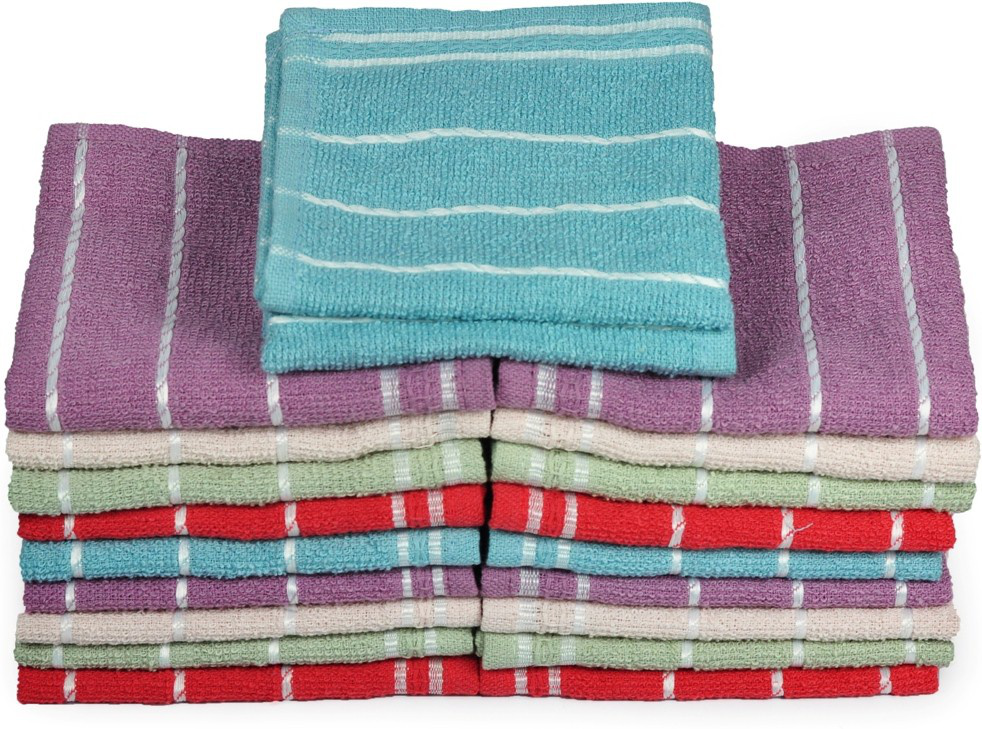

In [21]:
Image.open('data/Images/'+str(data.loc[data.index[2],'image']))

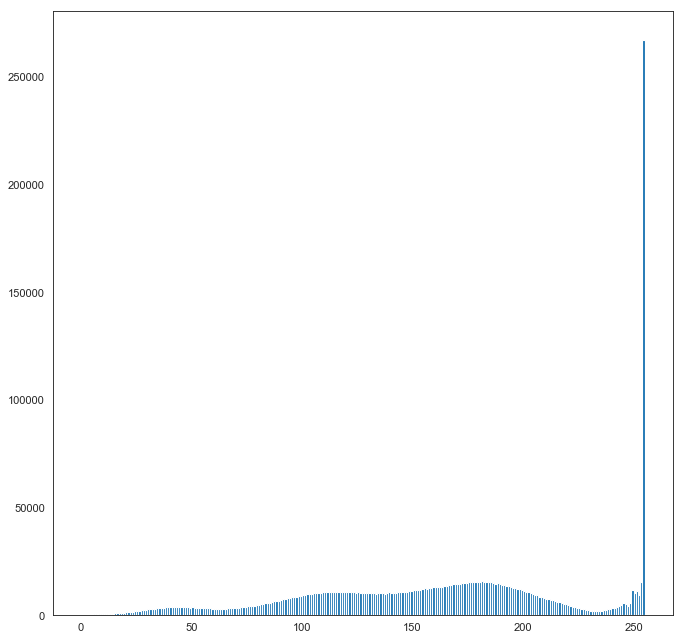

In [22]:
img = np.array(Image.open('data/Images/'+str(data.loc[data.index[2],'image'])))

fig,axes = plt.subplots(figsize=(10, 10), dpi= 80, facecolor='w', edgecolor='k')
plt.hist(img.flatten(), bins=range(256))

plt.show()

#### Etirement de l'histogramme

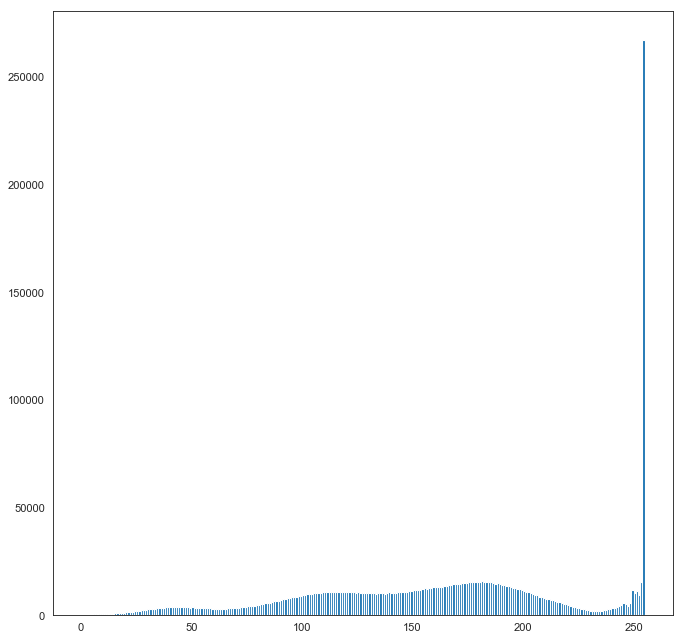

In [23]:
img2 = np.array(ImageOps.autocontrast(Image.open('data/Images/'+str(data.loc[data.index[2],'image']))))

fig,ax = plt.subplots(figsize=(10, 10), dpi= 80, facecolor='w', edgecolor='k')

n, bins, patches = plt.hist(img2.flatten(), bins=range(256))
plt.show()

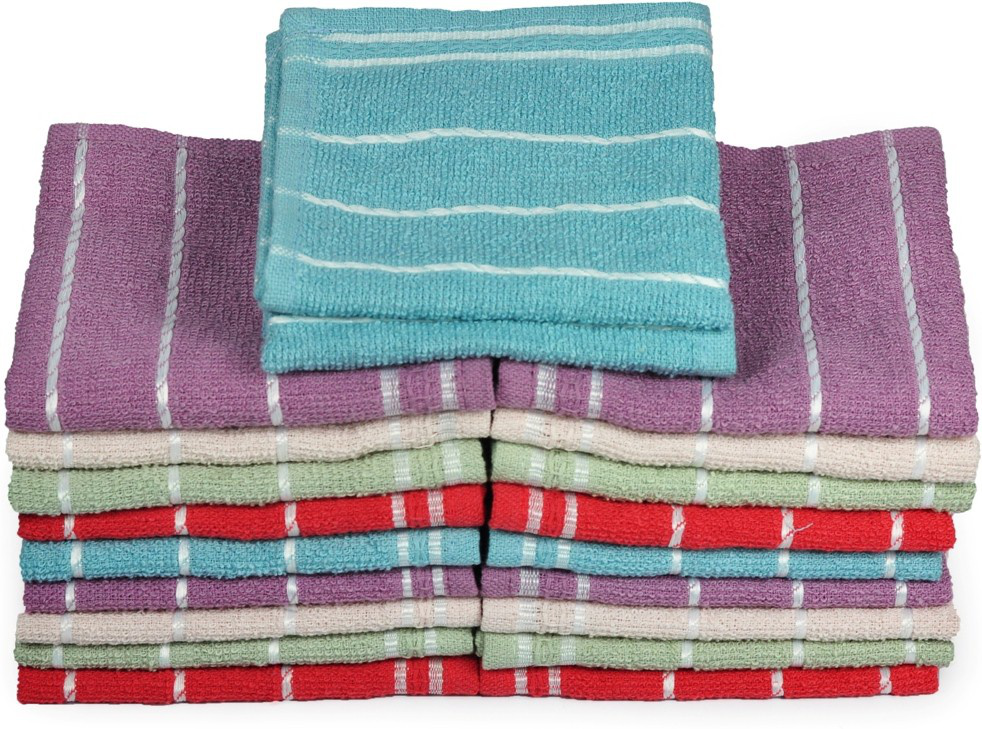

In [24]:
new_img2 = Image.fromarray(img2)
new_img2

#### Egalisation de l'histogramme

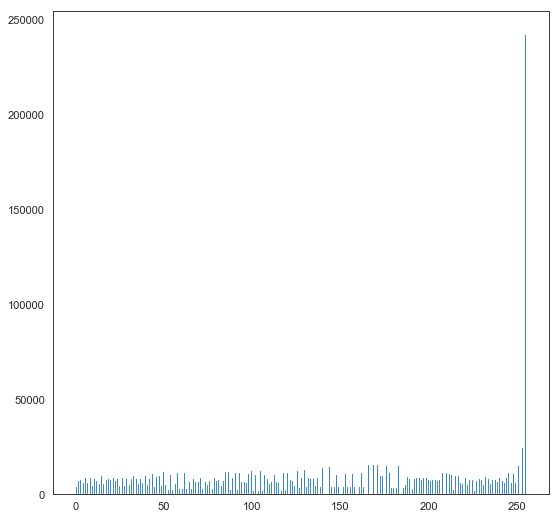

In [25]:
img3 = np.array(ImageOps.equalize(new_img2))

fig,ax = plt.subplots(figsize=(8, 8), dpi= 80, facecolor='w', edgecolor='k')

n, bins, patches = plt.hist(img3.flatten(), bins=range(256))
plt.show()

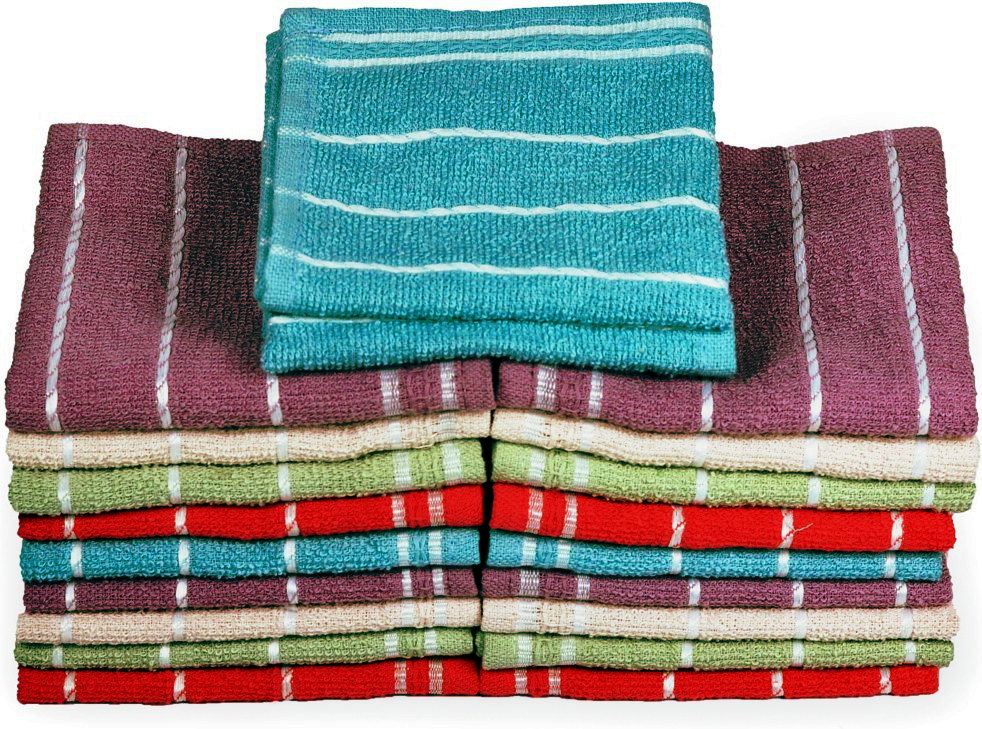

In [26]:
new_img3 = Image.fromarray(img3)
new_img3

#### Elimination du bruit

(729, 982, 3)


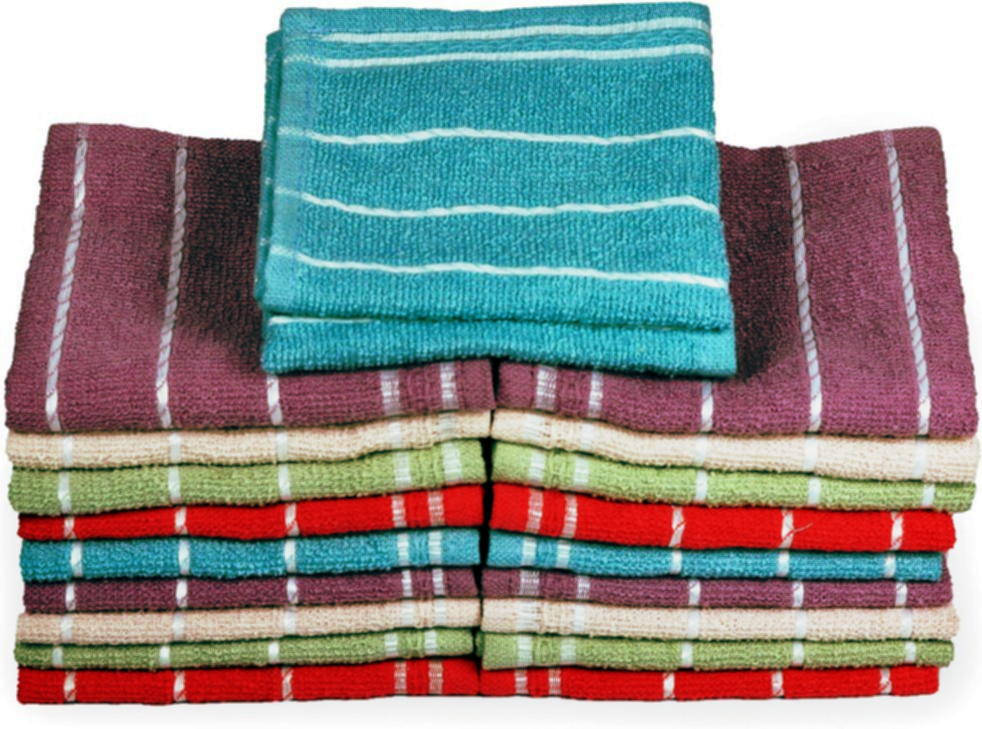

In [27]:
## Application d'un filtre moyenneurs
img4 = new_img3.filter(ImageFilter.BoxBlur(1))
print(np.array(img4).shape)
img4

(729, 982, 3)


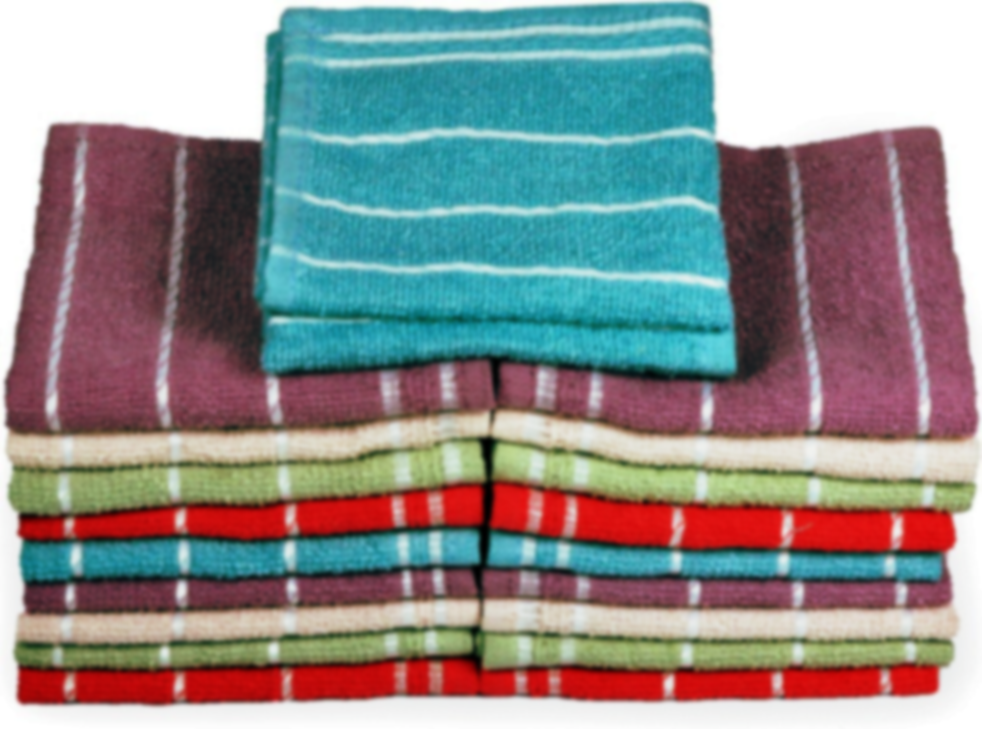

In [28]:
### Application d'un filtre Gaussien
img5 = new_img3.filter(ImageFilter.GaussianBlur())
print(np.array(img5).shape)
img5

#### Rédimensionnement de la taille

(228, 228, 3)


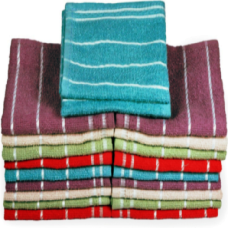

In [29]:
img6 = img5.resize((228,228))
print(np.array(img6).shape)
img6

#### Fonction de prétraitement des images

In [30]:
from PIL import Image, ImageOps, ImageFilter

def images_preprocessing(image,width,height):
    """This function preprocess images: 
    - Autocontrast
    - Equalization
    - Gaussian Filter
    - Resizing
    """
    
    img = np.array(ImageOps.autocontrast(image))
    img = np.array(ImageOps.equalize(Image.fromarray(img)))
    img = Image.fromarray(img).filter(ImageFilter.GaussianBlur())
    
    return img.resize((width,height))

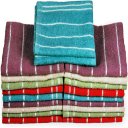

In [31]:
img = images_preprocessing(Image.open('data/Images/'+str(data.loc[data.index[2],'image'])),128,128)
img

In [32]:
print(np.array(img).shape)

(128, 128, 3)


### 3.2 Extraction des features

#### Via SIFT

In [33]:
import cv2

In [34]:
cv2.__version__

'3.4.2'

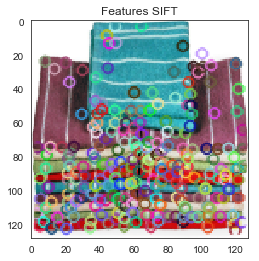

In [35]:
sift = cv2.xfeatures2d.SIFT_create()
keys_points = sift.detect(np.array(img),None)

img2 = cv2.drawKeypoints(np.array(img),keys_points,np.array(img))

plt.figure(figsize=(4,4))
plt.title('Features SIFT')
plt.imshow(img2)

In [36]:
print(np.array(img2).shape)

(128, 128, 3)


In [37]:
kps,des = sift.detectAndCompute(np.array(img),None)

In [38]:
des

array([[  2.,   1.,   1., ...,   0.,   0.,   0.],
       [  0.,   0.,   0., ...,   1.,   1.,   0.],
       [ 14.,  19.,   0., ...,   0.,   0.,   0.],
       ...,
       [  0.,   0.,  14., ...,   1.,   0.,   1.],
       [  1.,   1.,  18., ...,   0.,   0.,  16.],
       [137.,  56.,  12., ...,   0.,   0.,   0.]], dtype=float32)

In [39]:
kps

[<KeyPoint 0000022DEC9A5FC0>,
 <KeyPoint 0000022DE8CE8F30>,
 <KeyPoint 0000022DEDC34FC0>,
 <KeyPoint 0000022DEB8E5930>,
 <KeyPoint 0000022DEACC2C00>,
 <KeyPoint 0000022DEACC2BA0>,
 <KeyPoint 0000022DEE79A930>,
 <KeyPoint 0000022DEE79A840>,
 <KeyPoint 0000022DEE79A780>,
 <KeyPoint 0000022DEE79A570>,
 <KeyPoint 0000022DEE79A810>,
 <KeyPoint 0000022DEE79A990>,
 <KeyPoint 0000022DEE79A8D0>,
 <KeyPoint 0000022DEE79A900>,
 <KeyPoint 0000022DEE79A9F0>,
 <KeyPoint 0000022DEE79A9C0>,
 <KeyPoint 0000022DEE79AAB0>,
 <KeyPoint 0000022DEE79AA80>,
 <KeyPoint 0000022DEE79AA50>,
 <KeyPoint 0000022DEE79AA20>,
 <KeyPoint 0000022DEE79AAE0>,
 <KeyPoint 0000022DEE79AB10>,
 <KeyPoint 0000022DEE79AB40>,
 <KeyPoint 0000022DEE79AB70>,
 <KeyPoint 0000022DEE79ABA0>,
 <KeyPoint 0000022DEE79ABD0>,
 <KeyPoint 0000022DEE79AC00>,
 <KeyPoint 0000022DEE79AC30>,
 <KeyPoint 0000022DEE79AC60>,
 <KeyPoint 0000022DEE79AC90>,
 <KeyPoint 0000022DEE79ACC0>,
 <KeyPoint 0000022DEE79ACF0>,
 <KeyPoint 0000022DEE79AD20>,
 <KeyPoint

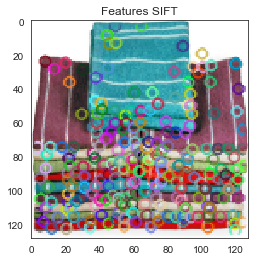

In [40]:
sift = cv2.xfeatures2d.SIFT_create()

keys_points = sift.detect(np.array(img),None)

img2 = cv2.drawKeypoints(np.array(img),keys_points,np.array(img))

plt.figure(figsize=(4,4))
plt.title('Features SIFT')
plt.imshow(img2)

In [41]:
print(len(des))

239


In [42]:
image_to_read = 'data/Images/'+str(data.loc[data.index[2],'image'])
                                            
im = cv2.imread(image_to_read)
im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
print(im.shape)

(729, 982, 3)


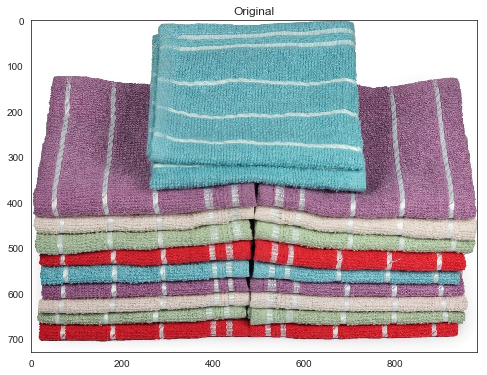

In [43]:
plt.figure(figsize=(8,8))
plt.title('Original')
plt.imshow(im)

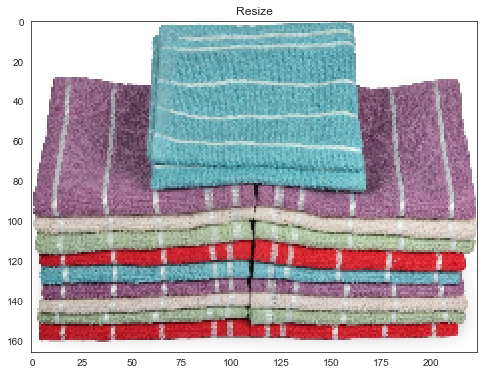

In [44]:
## Redimensionnement de l'image

new_size = 224
old_size = im.shape[:2]
ratio = float(new_size)/max(old_size)
tamp_size = tuple([int(x*ratio) for x in old_size])

im = cv2.resize(im, (tamp_size[1], tamp_size[0]))

plt.figure(figsize=(8,8))
plt.title('Resize')
plt.imshow(im)

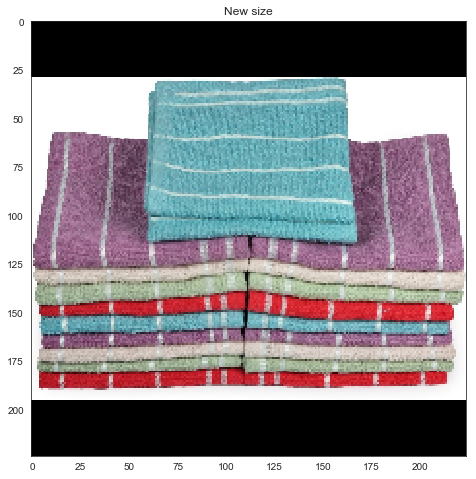

In [45]:
## Padding

delta_w = new_size - tamp_size[1]
delta_h = new_size - tamp_size[0]
top, bottom = delta_h//2, delta_h-(delta_h//2)
left, right = delta_w//2, delta_w-(delta_w//2)

color = [0, 0, 0]
new_im = cv2.copyMakeBorder(im, top, bottom, left, right, cv2.BORDER_CONSTANT,
    value=color)

plt.figure(figsize=(8,8))
plt.title('New size')
plt.imshow(new_im)

In [46]:
type(new_im)

numpy.ndarray

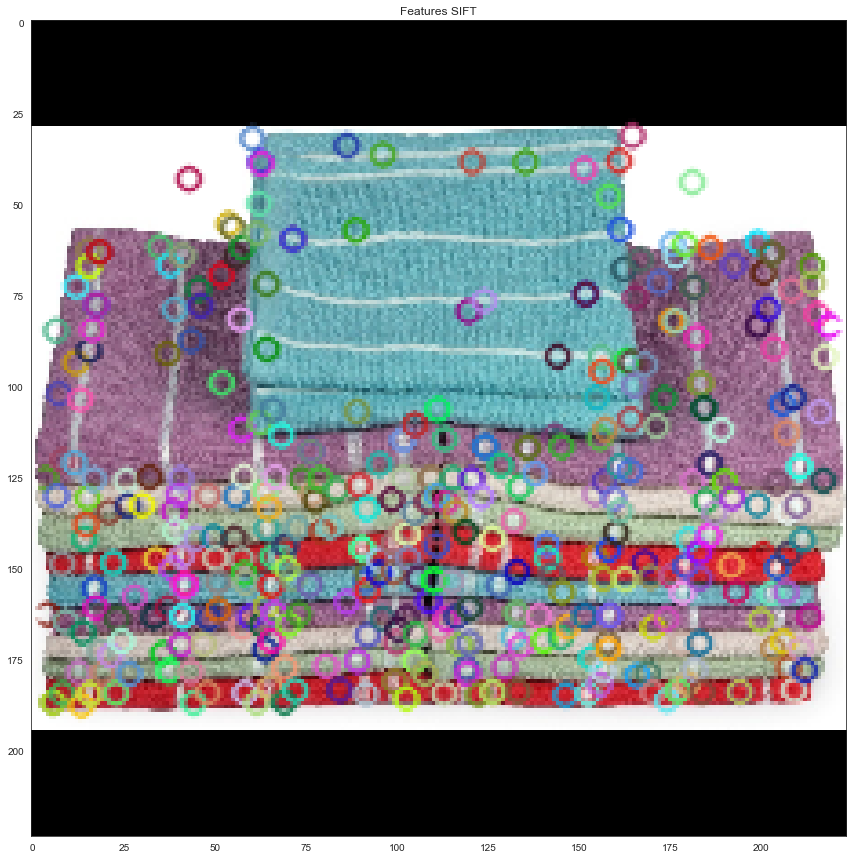

In [47]:
sift = cv2.xfeatures2d.SIFT_create()

keys_points = sift.detect(np.array(new_im),None)

img2 = cv2.drawKeypoints(np.array(new_im),keys_points,np.array(new_im))

plt.figure(figsize=(15,15))
plt.title('Features SIFT')
plt.imshow(img2)

In [48]:
len(keys_points)

415

In [49]:
img_shape = []

for img in data['image']:
    image_to_read = 'data/Images/'+str(img)
    im = cv2.imread(image_to_read)
    im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
    
    img_shape.append(im.shape[0])
    img_shape.append(im.shape[1])

In [50]:
print(min(img_shape),' ',max(img_shape))

145   11042


In [51]:
new_size = 224 #max(img_shape)
print(new_size)

224


In [52]:
data.shape

(1050, 20)

In [53]:
# generate random integer values
from random import seed
from random import randint

# seed random number generator
seed(1)
# generate some integers
idx = []
for _ in range(20):
    idx.append(randint(0, data.shape[0]))
    
print(idx)

[275, 129, 522, 241, 1014, 920, 967, 777, 429, 192, 999, 58, 798, 886, 4, 912, 545, 468, 209, 650]


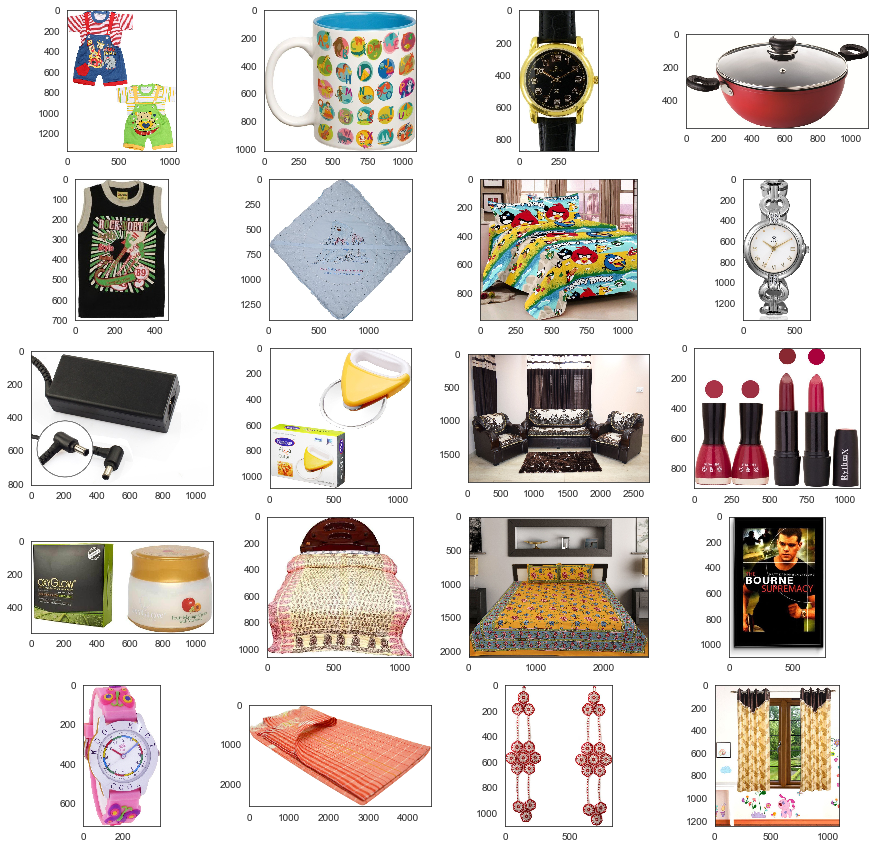

In [54]:
img_path = 'data/Images/'

fig, axes = plt.subplots(5,4, figsize=(15, 15), facecolor='w', edgecolor='k')

for img_idx,ax in zip(idx,axes.flatten()):
    img = cv2.imread(img_path + str(data.loc[data.index[img_idx],'image']))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    ax.imshow(img)

In [55]:
## Fonction de normalisation en taille des images 

def image_normalization(image_path,image_name,new_size):
    """ This function resize images"""
    
    image_to_read = image_path + image_name
                                            
    im = cv2.imread(image_to_read)
    im = cv2.cvtColor(im,cv2.COLOR_BGR2RGB)

    old_size = im.shape[:2]
    
    ratio = float(new_size)/max(old_size)

    tamp_size = tuple([int(x*ratio) for x in old_size])

    im = cv2.resize(im, (tamp_size[1], tamp_size[0]))

    delta_w = new_size - tamp_size[1]
    delta_h = new_size - tamp_size[0]
    top, bottom = delta_h//2, delta_h -(delta_h//2)
    left, right = delta_w//2, delta_w -(delta_w//2)
    
    color = [0, 0, 0]
    new_im = cv2.copyMakeBorder(im, top, bottom, left, right, cv2.BORDER_CONSTANT,value=color)
    
    return new_im 

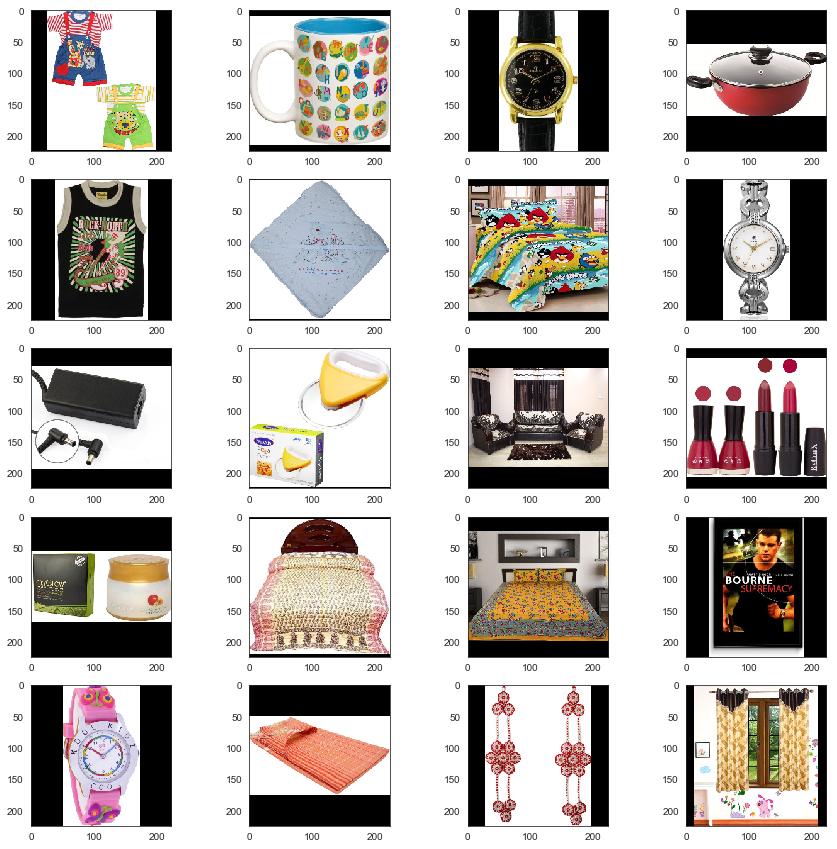

In [56]:
img_path = 'data/Images/'

fig, axes = plt.subplots(5,4, figsize=(15, 15), facecolor='w', edgecolor='k')

for img_idx,ax in zip(idx,axes.flatten()):
    img_name = str(data.loc[data.index[img_idx],'image'])
    
    img = image_normalization(img_path,img_name,new_size)
    
    ax.imshow(img)

#### Fonction d'extraction des features

In [57]:
def features_extraction(img,method):
    """This function extract feactures from image using specific method"""
    
    meth_init = method +'_create()'
    
    if method == 'ORB':
        meth = cv2.ORB_create()
    
    if method == 'SIFT':
        meth = cv2.xfeatures2d.SIFT_create()
        
    if method == 'SURF':
        meth = cv2.xfeatures2d.SURF_create()
        
    kps, desc = meth.detectAndCompute(np.array(img),None)

    return kps, desc

In [58]:
img_path = 'data/Images/'

for img_idx in idx:
    img_name = str(data.loc[data.index[img_idx],'image'])
    
    img = image_normalization(img_path,img_name,new_size)
    kps, desc = features_extraction(img,'SIFT')
    
    #print(len(kps))
    print(desc.shape)

(262, 128)
(339, 128)
(182, 128)
(76, 128)
(384, 128)
(73, 128)
(562, 128)
(150, 128)
(90, 128)
(98, 128)
(236, 128)
(163, 128)
(62, 128)
(709, 128)
(236, 128)
(235, 128)
(212, 128)
(173, 128)
(449, 128)
(565, 128)


## CNN

In [59]:
import sklearn.metrics as metrics
from sklearn.preprocessing import LabelEncoder, OneHotEncoder
from sklearn.model_selection import train_test_split

from keras.preprocessing.image import load_img, img_to_array
from keras.utils import to_categorical
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Activation, Dropout

Using TensorFlow backend.


In [60]:
## Fonction de normalisation en taille des images 

def image_normalization_2(image_path,image_name,new_size):
    """ This function resize images"""
    
    image_to_read = image_path + image_name
                                            
    im = cv2.imread(image_to_read)
    im = cv2.cvtColor(im,cv2.COLOR_BGR2RGB)
    
    old_size = im.shape[:2]
    
    ratio = float(new_size)/max(old_size)

    tamp_size = tuple([int(x*ratio) for x in old_size])

    im = cv2.resize(im, (tamp_size[1], tamp_size[0]))

    delta_w = new_size - tamp_size[1]
    delta_h = new_size - tamp_size[0]
    top, bottom = delta_h//2, delta_h -(delta_h//2)
    left, right = delta_w//2, delta_w -(delta_w//2)
    
    color = [0, 0, 0]
    new_im = cv2.copyMakeBorder(im, top, bottom, left, right, cv2.BORDER_CONSTANT,value=color)
    
    return new_im 

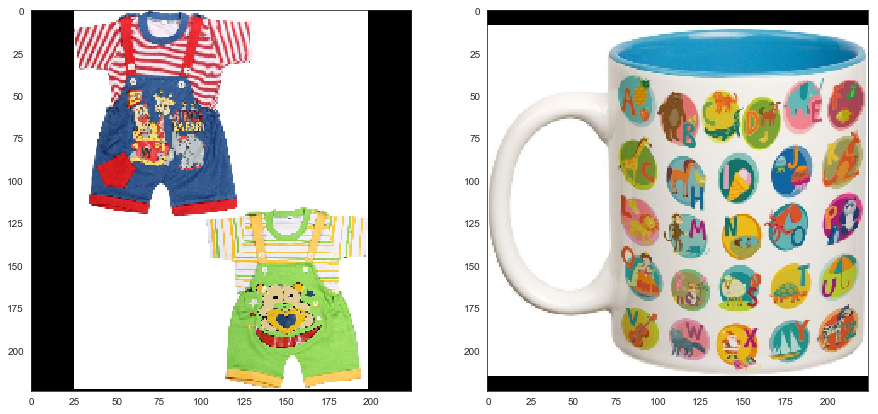

In [61]:
img_path = 'data/Images/'

fig, axes = plt.subplots(1,2, figsize=(15, 15), facecolor='w', edgecolor='k')

for img_idx,ax in zip(idx,axes.flatten()):
    img_name = str(data.loc[data.index[img_idx],'image'])
    
    img = image_normalization_2(img_path,img_name,new_size)
    
    ax.imshow(img)

In [62]:
def get_images_list(data_path,dataframe,new_size):
    """This function read image and resize it"""
    
    list_images = []
    
    
    for img_name in dataframe:
        print(img_name)
        img = image_normalization_2(data_path,img_name,new_size)
        
        list_images.append(img)
    
    return list_images

In [63]:
image_list = get_images_list(img_path,data['image'],new_size)

55b85ea15a1536d46b7190ad6fff8ce7.jpg
7b72c92c2f6c40268628ec5f14c6d590.jpg
64d5d4a258243731dc7bbb1eef49ad74.jpg
d4684dcdc759dd9cdf41504698d737d8.jpg
6325b6870c54cd47be6ebfbffa620ec7.jpg
893aa5ed55f7cff2eccea7758d7a86bd.jpg
f355cc1ccb08bd0d283ed979b7ee7515.jpg
dd0e3470a7e6ed76fd69c2da27721041.jpg
41384da51732c0b4df3de8f395714fbb.jpg
710ed5f2393a4b9e8823aa0029f71f93.jpg
920154acbe49d3202ed7d2ed2df1ea13.jpg
08452abdadb3db1e686b94a9c52fc7b6.jpg
1e8741b5ae27a513546c94b3f3312aee.jpg
189fa66a5fa6f08d2802a62ecf0be298.jpg
bbb8cdc5406ff60ff06ff64630f2ca47.jpg
1120bc768623572513df956172ffefeb.jpg
5479bb7028827d60000720a2c135976a.jpg
733aa1e801a139fa8dc7be9f0eff5ee0.jpg
62c35de4df27437d3597963fac55a8b6.jpg
33d97d63c037078cd3f08033966d6a88.jpg
d7ca2b06b4f4d3b98c61c377b18a2d6b.jpg
f74476ba64365d97a5be7d375cbf4c7a.jpg
fda50982a672ef8835de5c1cc86f8bfc.jpg
4788f5466992da09024b8ffcc8a5cba4.jpg
653826cd53f1d9e2c086c0ac7846ef70.jpg
3c74db45cbfc14a78b8466dca494b3bb.jpg
4aa047f14885c74f155ce5f973e14dff.jpg
7

4642d967bc34a36454b281de632f6c11.jpg
34d3b2b8d263294107a3ffc69b35ff8f.jpg
ed139e0d1b5c973495e1aa35dd4a5533.jpg
e1e133cbe616bee3b3e9e6f4f0882e3d.jpg
cf2ba696547459733c6bbfad4e3bcf62.jpg
be0e65c6d8c2cc8cb913b36aa4168cf0.jpg
2e8df36b35d22cf219cf8bae6c2af752.jpg
8f41774c16a931d71fcf01f8fee171e0.jpg
7e4c1d31e279a700c6b8e66d820e8601.jpg
1357e9d24661c3b5797aa1016e0c3be1.jpg
799ddb97164ff2d5d53bb8b27b8c355f.jpg
607dc41467008ee7a8dba0276f180f63.jpg
0c4718ae90f2889b7021a99ee1cc106c.jpg
85fe188e1ee8237b70df0d475907bf24.jpg
ea42376c9c52752d9d01bba12eb2999b.jpg
87f1807e002d3555b8dfb465a8a61df2.jpg
45d0af2c709de47268c80c35a117de44.jpg
0131e5d87b72877702d536299cf83b75.jpg
17611e6e94d73ef376834e5c6ee03dde.jpg
72cbc043d14ee578c789c9fab3c43cdd.jpg
6bc04b3ec1f8d4da2a00f8662f4fbed3.jpg
fb733e04ff2d72c59d8513eb574e81a2.jpg
fda51c31a1b7ae8f3c7b5c0174d3e201.jpg
c38eb8abdaa1d8c28bc8c262761dfbc5.jpg
73b692cdfce9a77b721a54d4b7fb35a7.jpg
40d7d3d1961236dd814e15592fa52994.jpg
9833d0de7f7e1927c807411c10b19189.jpg
7

994f1d8ade16b9fddce3c127eb7f38ed.jpg
17582ae953860b5320683768b8e97d3a.jpg
c063d07d78a55a21bf6c0e7c8ae46a6d.jpg
da2ce8d17a17f9d19b368434aedea5e9.jpg
3bc98543c7dd0d8fce5b8185b4a58c43.jpg
0bff0eda7a6677dc1acb0477a1f7a121.jpg
948699ab8c947ce56c256f9cf7996761.jpg
0b852704f2002f8865a68818ad4951da.jpg
9b9fc81808086cfd1ce5a2b46e2f9926.jpg
10ad262ebfdc8614e847d36e6fe9ecf9.jpg
dea88a5f46d5fc19236651e6b3e0b3fa.jpg
ba9f3a5ab1517a644322d856a7d25946.jpg
0f4f761de4224b004402c1f97e871ba4.jpg
1c0fdd598671f6f4e10b21435d766cf3.jpg
bd14484c68d8a2992a6fecad36bd9f37.jpg
721c1b67f86176f741d43cae1d1c7e93.jpg
a0133654f3911e47f021da4e49d42926.jpg
209bf06a732416f1ce5147a8b0524808.jpg
88ca277594f22bb7494f2d0bbc51f8ba.jpg
9f9bb0ef3bb8af571bcfbfa1a22150bd.jpg
a76bf8400b3dbcdbe5a5678f4a8ea0f6.jpg
a863d956964ed41b7c90f5138dc69db5.jpg
bb18279e9885136f1dbc8676d4af94e3.jpg
44b963eb856b4831dfdd21b666593c95.jpg
77f659d4d18381c991fb9210e05d9c1b.jpg
98659fb98a4fe903f21f5c315adbaede.jpg
0d02f4703fde00645704e15bba23e77d.jpg
5

59247d4024d85bfaf9e48368cba6d870.jpg
7d99ac27ad194bc62000c46779c42732.jpg
14bc693d9b86c58696e5917045e9d4de.jpg
1218fd9be42d45a81846db9f65a983bd.jpg
3f9f12fa8fc6d7ebef136040f179a201.jpg
7915f1c0703450d4b1446c06066d9a59.jpg
595f508cdfbfa162d0fe7b97cc99ef42.jpg
8a306758531cffad41e7a28e41576c49.jpg
ff24511994fc459d04145231c8876d6c.jpg
ce9207944cedeaa82e4ea6269586af2a.jpg
dbca6ab4ebf827884073e2890388b744.jpg
7729e54756a60aecb2067a747c890913.jpg
28401ff0dbc191d34c2f1103e78e082a.jpg
227fc5c4fca14c424ff33e40941d22fa.jpg
841b14271aa4c29f291f600c9556145c.jpg
6acca991d2353781779b866e4f96edd9.jpg
d68b774e9529a4b94a5c6c8943a1b8b3.jpg
83b7c331ebdd018bea7cecb6171eda96.jpg
a371cfcae8c6ec3b82ae37a83a8ae9b9.jpg
b33d82c619bf88c3e3bb8f53beab0c4b.jpg
3dfdf277bccb74532c0387adfed2897d.jpg
5cd3d274d71e1e0d6bf075421461b2d5.jpg
52a8d66e466da645e413d2cecc294bd9.jpg
7091af252a785131c5a124fb90705fda.jpg
7c785e9e26092c0b6ed038085e90d89d.jpg
00cbbc837d340fa163d11e169fbdb952.jpg
282102897daa1c2513cf76837a8d5a4c.jpg
e

5307e0db12b1018746ac3801d189c379.jpg
62e36e018c9ee4b282cf674e84054df8.jpg
fb42fce44e11f4dab8de99f8488281f8.jpg
3f9c4d0e8c3bca9c870e41f5098f90d6.jpg
af13232271963742c118a1c58affa259.jpg
7c333641c63bd7519432ae83744b8db4.jpg
60395c709b4a933319e2713e3ae620d4.jpg
cf1be83386eb96b2ab9598944ebca6fc.jpg
037b39bef3db7ccd264c577a0edf0c0a.jpg
43da6e88dcb61e027ea9112cfab158ee.jpg
7b1c5edc85bc7e31edf49ab70034bb3a.jpg
6e6694c52c9273cde2163d34d5b44e94.jpg
09f9f9b420edea2f39c0dc3c24d5be07.jpg
9e07a3eeee6aa9e656106281cdd30d67.jpg
b7e42b52534c5e49eb03817d754c2153.jpg
9c9385abdb73ec1f1f93acaf81c6e1d7.jpg
c12fd368ff03f5224b92771824cafb9c.jpg
283e2c4d728bdb193834d876ec27e6dd.jpg
9cd443dad2c8f354fd01869a57fdc171.jpg
8b7a51c69b47f4714b5f7131077b5d30.jpg
8026dc3e27e8e318cc7431a723f7ebc1.jpg
2cc24452688ed35dfbff566e22e53c95.jpg
4946e2411d24801b9e8f7dbe97ab1b93.jpg
c417f408340252f170f05dadf88160d7.jpg
f41761a931135c6c043c7e04abda41b0.jpg
cd71b07a1d37a5e2cc04240e8498cc76.jpg
edec3bb5df9c4bc618752e94532bb36e.jpg
5

In [64]:
len(image_list)

1050

In [65]:
image_list[0].shape

(224, 224, 3)

In [66]:
im_shape = image_list[0].shape

In [67]:
X = np.vstack([i.reshape(1,im_shape[0],im_shape[1],im_shape[2]) for i in image_list])
Y = data['category_level_1']

In [68]:
X.shape

(1050, 224, 224, 3)

In [69]:
Y.shape

(1050,)

In [70]:
from sklearn.preprocessing import OneHotEncoder

encoder = OneHotEncoder(handle_unknown='ignore')
y_encode = encoder.fit_transform(np.array(data['category_level_1']).reshape(-1,1))
y_encode

<1050x7 sparse matrix of type '<class 'numpy.float64'>'
	with 1050 stored elements in Compressed Sparse Row format>

In [71]:
classes = list(encoder.categories_[0])
classes

['Baby Care ',
 'Beauty and Personal Care ',
 'Computers ',
 'Home Decor & Festive Needs ',
 'Home Furnishing ',
 'Kitchen & Dining ',
 'Watches ']

In [72]:
y_encode.todense()

matrix([[0., 0., 0., ..., 1., 0., 0.],
        [1., 0., 0., ..., 0., 0., 0.],
        [1., 0., 0., ..., 0., 0., 0.],
        ...,
        [1., 0., 0., ..., 0., 0., 0.],
        [1., 0., 0., ..., 0., 0., 0.],
        [1., 0., 0., ..., 0., 0., 0.]])

In [73]:
X_train, X_test, y_train, y_test = train_test_split(X,y_encode.todense(),test_size=0.2,random_state=42)

In [74]:
X_train = X_train/255
X_test = X_test/255

In [81]:
model = Sequential()

model.add(Conv2D(8,(3,3),activation='relu',input_shape=(new_size,new_size,3)))
model.add(Conv2D(8,(3,3),activation='relu'))
model.add(MaxPooling2D(pool_size=(2,2)))
model.add(Dropout(0.25))

model.add(Conv2D(8,(3,3),activation='relu'))
model.add(Conv2D(8,(3,3),activation='relu'))
model.add(MaxPooling2D(pool_size=(2,2)))
model.add(Dropout(0.25))

model.add(Conv2D(16,(3,3),activation='relu'))
model.add(Conv2D(16,(3,3),activation='relu'))
model.add(MaxPooling2D(pool_size=(2,2)))
model.add(Dropout(0.25))

model.add(Conv2D(32,(3,3),activation='relu'))
model.add(Conv2D(32,(3,3),activation='relu'))
model.add(MaxPooling2D(pool_size=(2,2)))
model.add(Dropout(0.25))

model.add(Flatten())
model.add(Dense(12,activation='relu'))
model.add(Dropout(0.25))
model.add(Dense(encoder.categories_[0].shape[0],activation='softmax'))

model.compile(loss='categorical_crossentropy',optimizer='adam',metrics=['accuracy'])

In [82]:
model.summary()

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_17 (Conv2D)           (None, 222, 222, 8)       224       
_________________________________________________________________
conv2d_18 (Conv2D)           (None, 220, 220, 8)       584       
_________________________________________________________________
max_pooling2d_9 (MaxPooling2 (None, 110, 110, 8)       0         
_________________________________________________________________
dropout_11 (Dropout)         (None, 110, 110, 8)       0         
_________________________________________________________________
conv2d_19 (Conv2D)           (None, 108, 108, 8)       584       
_________________________________________________________________
conv2d_20 (Conv2D)           (None, 106, 106, 8)       584       
_________________________________________________________________
max_pooling2d_10 (MaxPooling (None, 53, 53, 8)        

In [83]:
history = model.fit(X_train,y_train,batch_size=100,epochs=50,verbose=1, validation_data=(X_test,y_test))

Train on 840 samples, validate on 210 samples
Epoch 1/50
840/840 [==============================] - 10s 12ms/step - loss: 1.9484 - accuracy: 0.1405 - val_loss: 1.9459 - val_accuracy: 0.1095
Epoch 2/50
840/840 [==============================] - 9s 11ms/step - loss: 1.9376 - accuracy: 0.1988 - val_loss: 1.9412 - val_accuracy: 0.3143
Epoch 3/50
840/840 [==============================] - 9s 11ms/step - loss: 1.9118 - accuracy: 0.1845 - val_loss: 1.9116 - val_accuracy: 0.2381
Epoch 4/50
840/840 [==============================] - 9s 11ms/step - loss: 1.8914 - accuracy: 0.2381 - val_loss: 1.9107 - val_accuracy: 0.2571
Epoch 5/50
840/840 [==============================] - 9s 11ms/step - loss: 1.8476 - accuracy: 0.2548 - val_loss: 1.8491 - val_accuracy: 0.3095
Epoch 6/50
840/840 [==============================] - 9s 11ms/step - loss: 1.7997 - accuracy: 0.2857 - val_loss: 1.8489 - val_accuracy: 0.2524
Epoch 7/50
840/840 [==============================] - 9s 11ms/step - loss: 1.7680 - accuracy: 0

In [84]:
print(history.history.keys())

dict_keys(['val_loss', 'val_accuracy', 'loss', 'accuracy'])


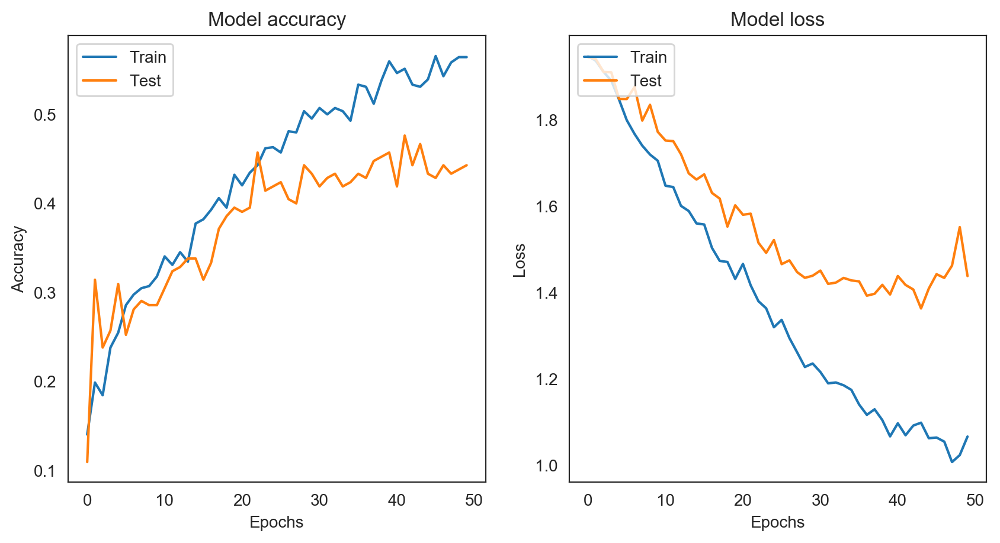

In [85]:
fig = plt.figure(figsize=(10, 5), dpi = 200, facecolor='w', edgecolor='k')

ax1 = plt.subplot(1,2,1)
ax1.plot(history.history['accuracy'])
ax1.plot(history.history['val_accuracy'])

ax1.set(title='Model accuracy')
ax1.set_ylabel('Accuracy')
ax1.set_xlabel('Epochs')
ax1.legend(['Train', 'Test'], loc='upper left')

ax2 = plt.subplot(1,2,2)
ax2.plot(history.history['loss'])
ax2.plot(history.history['val_loss'])

ax2.set(title='Model loss')
ax2.set_ylabel('Loss')
ax2.set_xlabel('Epochs')
ax2.legend(['Train', 'Test'], loc='upper left')

plt.show()

In [86]:
model.evaluate(X_test,y_test)

210/210 [==============================] - 1s 5ms/step


[1.4385221390497116, 0.44285714626312256]

In [87]:
labels = model.predict_classes(X_test)

In [88]:
labels

array([5, 0, 2, 1, 6, 3, 3, 3, 0, 4, 6, 2, 5, 0, 0, 2, 0, 4, 4, 0, 5, 1,
       1, 3, 6, 2, 0, 3, 1, 5, 5, 4, 3, 6, 0, 5, 6, 0, 0, 5, 4, 4, 0, 1,
       4, 2, 2, 1, 0, 2, 5, 5, 5, 3, 4, 2, 1, 5, 1, 4, 0, 0, 0, 4, 1, 5,
       1, 4, 4, 6, 0, 5, 3, 1, 0, 4, 4, 0, 2, 4, 0, 4, 0, 4, 3, 6, 3, 0,
       3, 0, 4, 4, 5, 0, 6, 1, 0, 0, 2, 1, 4, 2, 5, 4, 1, 6, 4, 2, 1, 2,
       2, 4, 4, 0, 4, 0, 3, 3, 6, 2, 2, 1, 3, 4, 5, 5, 1, 0, 0, 4, 5, 4,
       0, 5, 2, 5, 2, 1, 5, 3, 5, 4, 3, 0, 4, 6, 6, 1, 3, 0, 6, 3, 6, 4,
       3, 0, 1, 1, 0, 1, 6, 6, 4, 0, 3, 6, 6, 1, 6, 5, 6, 1, 4, 6, 1, 1,
       3, 3, 4, 2, 5, 3, 1, 4, 0, 1, 2, 1, 1, 2, 1, 6, 4, 4, 5, 4, 1, 2,
       2, 0, 1, 4, 1, 4, 0, 2, 6, 3, 4, 5], dtype=int64)

In [89]:
proba = model.predict_proba(X_test)

In [90]:
proba.shape

(210, 7)

In [91]:
from sklearn.manifold import TSNE

X_embedded = TSNE(n_components=2).fit_transform(proba)
X_embedded.shape

(210, 2)

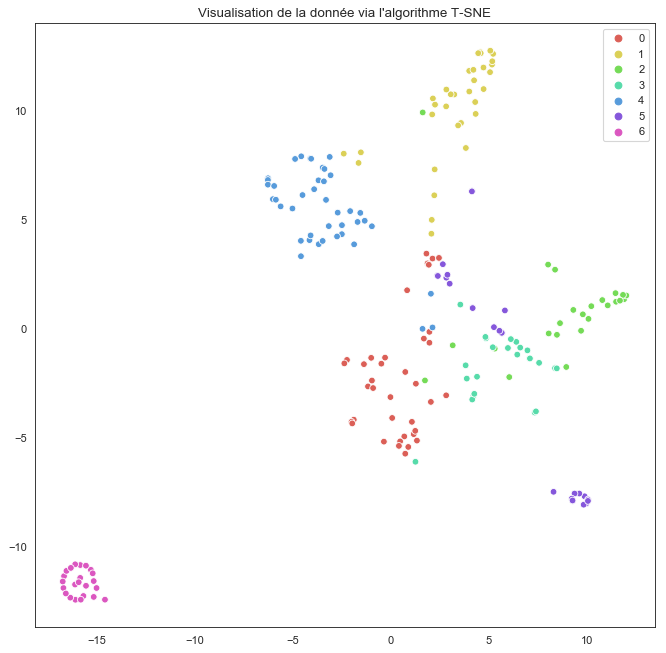

In [92]:
fig,ax = plt.subplots(figsize=(10, 10), dpi= 80, facecolor='w', edgecolor='k')

plt.title("Visualisation de la donnée via l'algorithme T-SNE")
g = sns.scatterplot(X_embedded[:,0], X_embedded[:,1],
                    hue=labels,
                    palette=sns.color_palette("hls",n_colors=len(np.unique(labels))))

plt.show()

In [93]:
def plot_confusion_matrix(y_true, y_pred, classes,
                          normalize=False,
                          title=None,
                          cmap="viridis"):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if not title:
        if normalize:
            title = 'Normalized confusion matrix'
        else:
            title = 'Confusion matrix, without normalization'# Compute confusion matrix
    cm = metrics.confusion_matrix(y_true, y_pred)
    # Only use the labels that appear in the data
    #classes = classes[unique_labels(y_true, y_pred)]
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')
        
    print(cm)
    
    fig, ax = plt.subplots(figsize=(8,8))
    im = ax.imshow(cm, interpolation='nearest', cmap=cmap)
    
    ax.figure.colorbar(im, ax=ax,fraction=0.045,pad=0.05)
    
    ax.set_xticks(np.arange(cm.shape[1]))
    ax.set_yticks(np.arange(cm.shape[0]))
    
    ax.set_xticklabels(classes)
    ax.set_yticklabels(classes)

    ax.set_title(title)
    
    plt.setp(ax.get_xticklabels(), rotation=45, ha="right",
         rotation_mode="anchor")

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            ax.text(j, i, format(cm[i, j], fmt),
                    ha="center", va="center",
                    color="black" if cm[i, j] > thresh else "white",fontsize=14)
    fig.tight_layout()
    return ax

Confusion matrix, without normalization
[[10  4  4  2  6  1  0]
 [ 3 12  1  1  4  0  0]
 [ 4  9  7  8  6  4  0]
 [10  0  4  8  3  5  0]
 [ 6  4  2  2 19  2  0]
 [ 2  0  5  2  3 14  0]
 [ 3  5  1  1  0  0 23]]


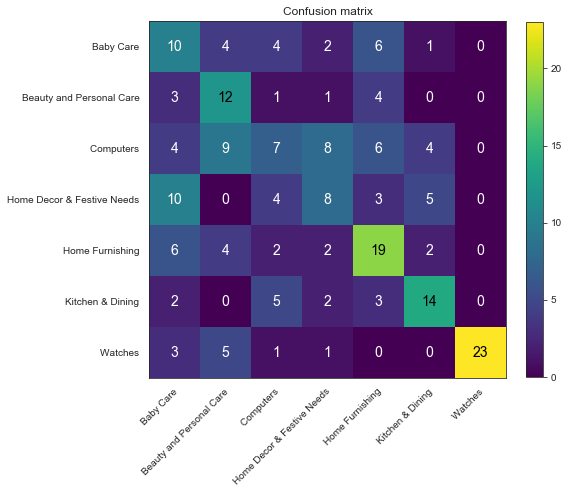

In [94]:
test_labels = np.argmax(y_test, axis=1)

plot_confusion_matrix(test_labels, labels, classes= classes,title='Confusion matrix')

In [95]:
def get_images_list_2(data_path,dataframe,new_size):
    """This function read image and resize it"""
    
    list_images = []
    
    
    for img_name in dataframe:
        img = load_img(data_path+img_name,target_size=(new_size,new_size))
        img = img_to_array(img)
        
        list_images.append(img)
    
    return list_images

In [96]:
image_list = get_images_list_2('data/Images/',data['image'],224)
im_shape = image_list[0].shape
im_shape

C:\ProgramData\Anaconda3\lib\site-packages\PIL\Image.py:2575: DecompressionBombWarning: Image size (93680328 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  DecompressionBombWarning)


(224, 224, 3)

In [97]:
X = np.vstack([i.reshape(1,im_shape[0],im_shape[1],im_shape[2]) for i in image_list])

In [98]:
X.shape

(1050, 224, 224, 3)

In [99]:
X_train, X_test, y_train, y_test = train_test_split(X,y_encode.todense(),test_size=0.2,random_state=42)

In [100]:
from keras.preprocessing.image import ImageDataGenerator 

In [101]:
train_datagen = ImageDataGenerator(
    rescale=1./255,
    #rotation_range=90,
    brightness_range=[0.7,1.3], 
    #horizontal_flip=True,
    #vertical_flip=True
)

test_datagen = ImageDataGenerator(rescale=1./255)

(32, 224, 224, 3)


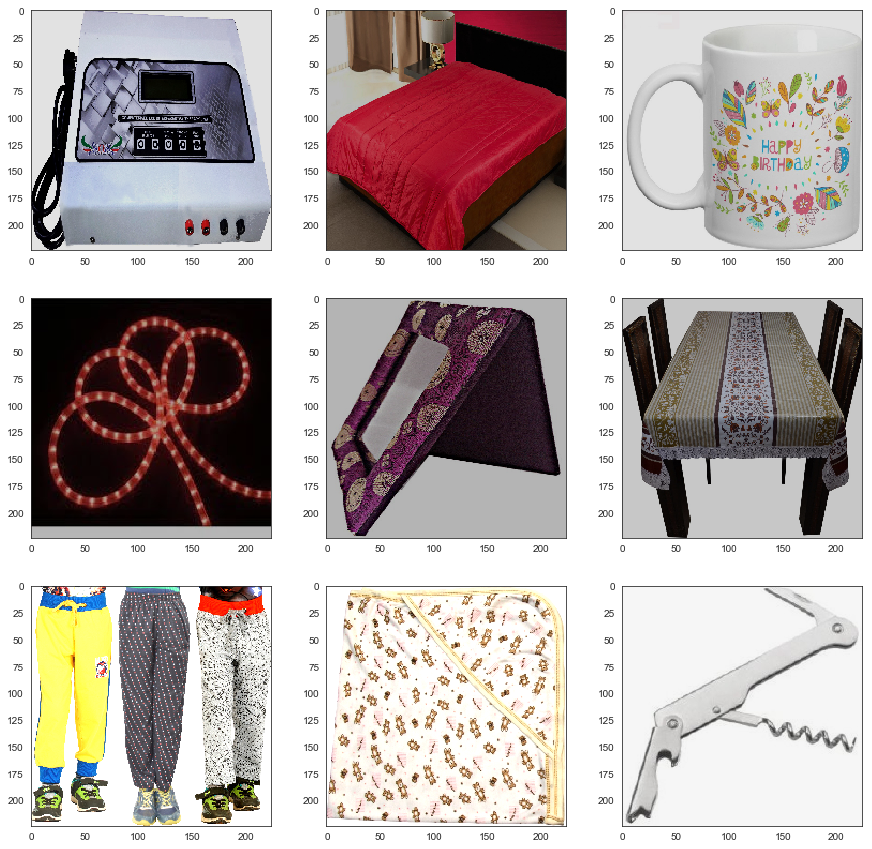

In [102]:
train_datagen.fit(X_train)

fig = plt.figure(figsize=(15, 15), facecolor='w', edgecolor='k')

for x_batch, y_batch in train_datagen.flow(X_train, y_train):
    print(x_batch.shape)
    # Show the first 9 images
    for i in range(0, 9):
        plt.subplot(330 + 1 + i)
        plt.imshow(x_batch[i].reshape(new_size, new_size, 3))
    # show the plot
    plt.show()
    break

In [103]:
train_generator = train_datagen.flow(X_train, y_train)
test_generator = test_datagen.flow(X_test, y_test)

In [104]:
history = model.fit_generator(
    train_generator,
    epochs=50,
    steps_per_epoch=X_train.shape[0] // 32,
    verbose=1, 
    validation_data=test_generator)

Epoch 1/50
26/26 [==============================] - 10s 403ms/step - loss: 1.6974 - accuracy: 0.3230 - val_loss: 1.9573 - val_accuracy: 0.1952
Epoch 2/50
26/26 [==============================] - 10s 394ms/step - loss: 1.5537 - accuracy: 0.3936 - val_loss: 1.7674 - val_accuracy: 0.4143
Epoch 3/50
26/26 [==============================] - 10s 389ms/step - loss: 1.5505 - accuracy: 0.3973 - val_loss: 1.2346 - val_accuracy: 0.4143
Epoch 4/50
26/26 [==============================] - 10s 393ms/step - loss: 1.4076 - accuracy: 0.4542 - val_loss: 1.6361 - val_accuracy: 0.4714
Epoch 5/50
26/26 [==============================] - 10s 391ms/step - loss: 1.4301 - accuracy: 0.4208 - val_loss: 1.6431 - val_accuracy: 0.4190
Epoch 6/50
26/26 [==============================] - 10s 402ms/step - loss: 1.3569 - accuracy: 0.4493 - val_loss: 1.6465 - val_accuracy: 0.4524
Epoch 7/50
26/26 [==============================] - 10s 401ms/step - loss: 1.2243 - accuracy: 0.4963 - val_loss: 1.5908 - val_accuracy: 0.4524

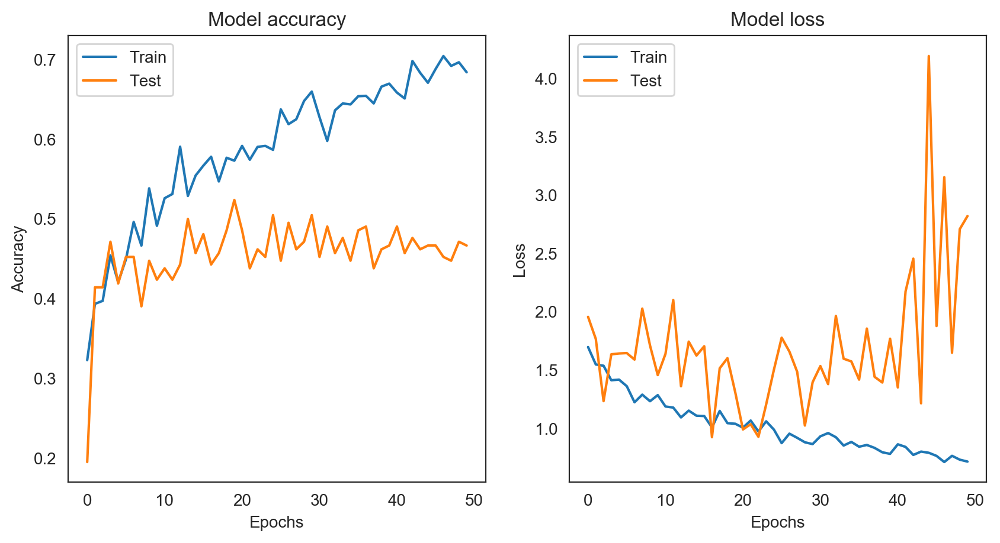

In [105]:
fig = plt.figure(figsize=(10, 5), dpi = 200, facecolor='w', edgecolor='k')

ax1 = plt.subplot(1,2,1)
ax1.plot(history.history['accuracy'])
ax1.plot(history.history['val_accuracy'])

ax1.set(title='Model accuracy')
ax1.set_ylabel('Accuracy')
ax1.set_xlabel('Epochs')
ax1.legend(['Train', 'Test'], loc='upper left')

ax2 = plt.subplot(1,2,2)
ax2.plot(history.history['loss'])
ax2.plot(history.history['val_loss'])

ax2.set(title='Model loss')
ax2.set_ylabel('Loss')
ax2.set_xlabel('Epochs')
ax2.legend(['Train', 'Test'], loc='upper left')

plt.show()

In [106]:
model.evaluate(test_generator)

7/7 [==============================] - 1s 144ms/step


[2.432084798812866, 0.46666666865348816]

In [107]:
labels = model.predict_classes(X_test)

In [108]:
proba = model.predict_proba(X_test)

In [109]:
X_embedded = TSNE(n_components=2).fit_transform(proba)
X_embedded.shape

(210, 2)

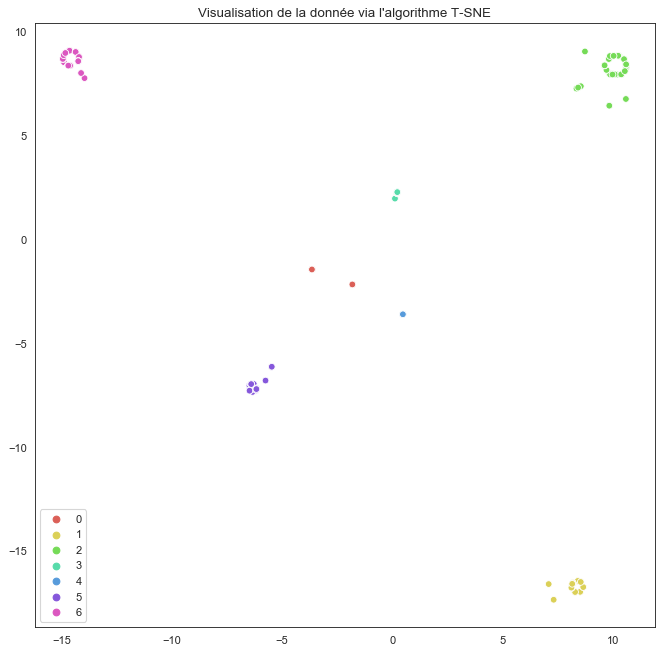

In [110]:
fig,ax = plt.subplots(figsize=(10, 10), dpi= 80, facecolor='w', edgecolor='k')

plt.title("Visualisation de la donnée via l'algorithme T-SNE")
g = sns.scatterplot(X_embedded[:,0], X_embedded[:,1],
                    hue=labels,
                    palette=sns.color_palette("hls", n_colors=len(np.unique(labels))))

plt.show()

Confusion matrix, without normalization
[[ 5  1  3  4  5  4  5]
 [ 2  9  2  2  2  3  1]
 [ 1  8 25  1  0  2  1]
 [ 4  3  5  7  4  6  1]
 [ 6  7  8  2  5  3  4]
 [ 1  4  3  4  0 13  1]
 [ 0  2  3  2  0  1 25]]


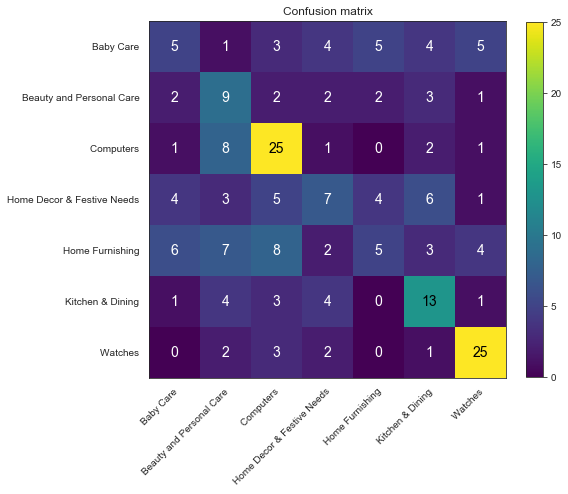

In [111]:
test_labels = np.argmax(y_test, axis=1)

plot_confusion_matrix(test_labels, labels, classes= classes,title='Confusion matrix')

## Transfert learning

In [112]:
X_train.shape

(840, 224, 224, 3)

In [113]:
y_train.shape

(840, 7)

In [114]:
X_test.shape

(210, 224, 224, 3)

In [115]:
y_test.shape

(210, 7)

In [116]:
train_datagen = ImageDataGenerator(
    rescale=1./255,
    #rotation_range=90,
    #shear_range=45.0,
    brightness_range=[0.7,1.3], 
    #horizontal_flip=True,
    #vertical_flip=True
)

test_datagen = ImageDataGenerator(rescale=1./255)

In [117]:
train_generator = train_datagen.flow(X_train, y_train)
test_generator = test_datagen.flow(X_test, y_test)

In [118]:
train_generator

### 1. Entrainement du model VGG16

In [135]:
from keras.applications.vgg16 import VGG16
from keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Activation, Dropout
from keras import optimizers,Model

In [136]:
model = VGG16(weights="imagenet", include_top=False, input_shape=(224, 224, 3))

In [137]:
model.summary()

Model: "vgg16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_3 (InputLayer)         (None, 224, 224, 3)       0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0     

In [138]:
for layer in model.layers:
    layer.trainable = False
    
for layer in model.layers:
    print(layer, layer.trainable)

<keras.engine.input_layer.InputLayer object at 0x0000022D9E265748> False
<keras.layers.convolutional.Conv2D object at 0x0000022D9E265908> False
<keras.layers.convolutional.Conv2D object at 0x0000022D9E265BE0> False
<keras.layers.pooling.MaxPooling2D object at 0x0000022E5863F5C0> False
<keras.layers.convolutional.Conv2D object at 0x0000022E5863FE10> False
<keras.layers.convolutional.Conv2D object at 0x0000022D99C00B00> False
<keras.layers.pooling.MaxPooling2D object at 0x0000022E5B8C5198> False
<keras.layers.convolutional.Conv2D object at 0x0000022E58658898> False
<keras.layers.convolutional.Conv2D object at 0x0000022E5B8F6C50> False
<keras.layers.convolutional.Conv2D object at 0x0000022E5B910208> False
<keras.layers.pooling.MaxPooling2D object at 0x0000022E5B943470> False
<keras.layers.convolutional.Conv2D object at 0x0000022E5B943208> False
<keras.layers.convolutional.Conv2D object at 0x0000022E5B9752B0> False
<keras.layers.convolutional.Conv2D object at 0x0000022E5B9AC2B0> False
<ker

In [139]:
new_model = Sequential()

new_model.add(model)

new_model.add(Flatten())
new_model.add(Dense(12,activation='relu'))
new_model.add(Dropout(0.25))
new_model.add(Dense(encoder.categories_[0].shape[0],activation='softmax'))

new_model.summary()

Model: "sequential_6"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
vgg16 (Model)                (None, 7, 7, 512)         14714688  
_________________________________________________________________
flatten_6 (Flatten)          (None, 25088)             0         
_________________________________________________________________
dense_11 (Dense)             (None, 12)                301068    
_________________________________________________________________
dropout_18 (Dropout)         (None, 12)                0         
_________________________________________________________________
dense_12 (Dense)             (None, 7)                 91        
Total params: 15,015,847
Trainable params: 301,159
Non-trainable params: 14,714,688
_________________________________________________________________


In [140]:
new_model.compile(loss='categorical_crossentropy',optimizer=optimizers.Adam(lr=1e-4),metrics=['accuracy'])

history = new_model.fit_generator(
    train_generator,
    epochs=50,
    steps_per_epoch=X_train.shape[0] // 32,
    verbose=1, 
    validation_data=test_generator)

Epoch 1/50
26/26 [==============================] - 307s 12s/step - loss: 1.7951 - accuracy: 0.2983 - val_loss: 1.3948 - val_accuracy: 0.5714
Epoch 2/50
26/26 [==============================] - 293s 11s/step - loss: 1.3721 - accuracy: 0.5235 - val_loss: 1.1161 - val_accuracy: 0.6571
Epoch 3/50
26/26 [==============================] - 293s 11s/step - loss: 1.1585 - accuracy: 0.6010 - val_loss: 1.5454 - val_accuracy: 0.6762
Epoch 4/50
26/26 [==============================] - 279s 11s/step - loss: 1.0553 - accuracy: 0.6480 - val_loss: 0.7365 - val_accuracy: 0.7286
Epoch 5/50
26/26 [==============================] - 286s 11s/step - loss: 0.9656 - accuracy: 0.6894 - val_loss: 0.5759 - val_accuracy: 0.7667
Epoch 6/50
26/26 [==============================] - 285s 11s/step - loss: 0.8553 - accuracy: 0.7290 - val_loss: 0.8232 - val_accuracy: 0.7714
Epoch 7/50
26/26 [==============================] - 286s 11s/step - loss: 0.8089 - accuracy: 0.7413 - val_loss: 0.8388 - val_accuracy: 0.7810
Epoch 

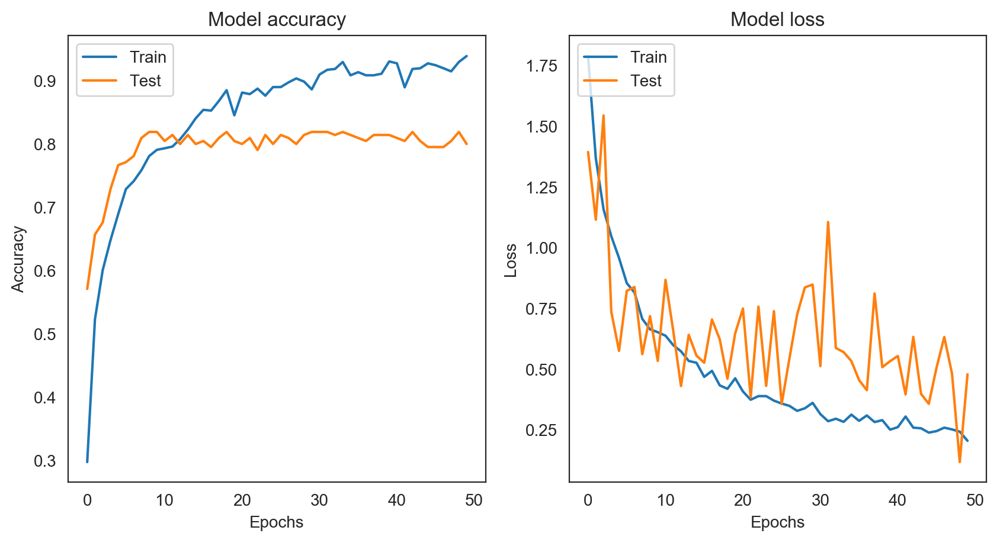

In [141]:
fig = plt.figure(figsize=(10, 5), dpi = 200, facecolor='w', edgecolor='k')

ax1 = plt.subplot(1,2,1)
ax1.plot(history.history['accuracy'])
ax1.plot(history.history['val_accuracy'])

ax1.set(title='Model accuracy')
ax1.set_ylabel('Accuracy')
ax1.set_xlabel('Epochs')
ax1.legend(['Train', 'Test'], loc='upper left')

ax2 = plt.subplot(1,2,2)
ax2.plot(history.history['loss'])
ax2.plot(history.history['val_loss'])

ax2.set(title='Model loss')
ax2.set_ylabel('Loss')
ax2.set_xlabel('Epochs')
ax2.legend(['Train', 'Test'], loc='upper left')

plt.show()

In [142]:
new_model.evaluate(test_generator)

7/7 [==============================] - 59s 8s/step


[0.6344934701919556, 0.800000011920929]

In [143]:
labels = new_model.predict_classes(X_test)

In [144]:
proba = new_model.predict_proba(X_test)

In [145]:
X_embedded = TSNE(n_components=2).fit_transform(proba)
X_embedded.shape

(210, 2)

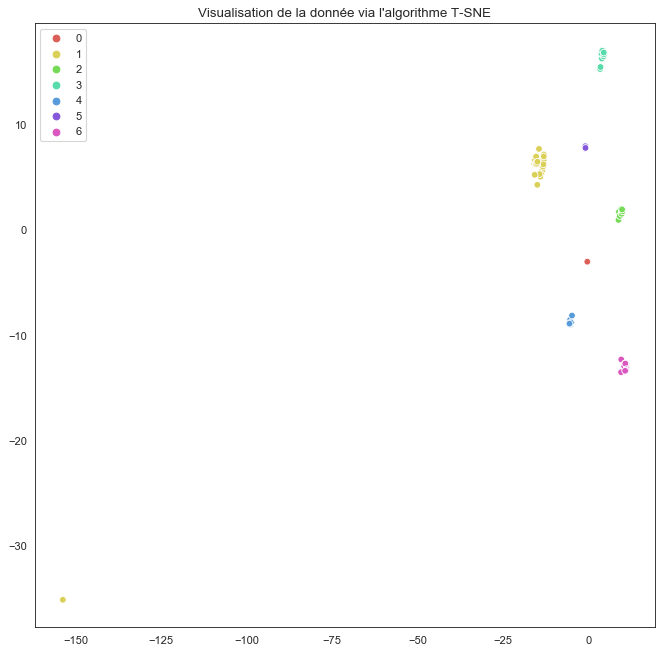

In [146]:
fig,ax = plt.subplots(figsize=(10, 10), dpi= 80, facecolor='w', edgecolor='k')

plt.title("Visualisation de la donnée via l'algorithme T-SNE")
g = sns.scatterplot(X_embedded[:,0], X_embedded[:,1],
                    hue=labels,
                    palette=sns.color_palette("hls", n_colors=len(np.unique(labels))))

plt.show()

Confusion matrix, without normalization
[[13  7  0  2  4  0  1]
 [ 0 19  0  1  0  0  1]
 [ 0 14 23  0  0  1  0]
 [ 1  1  0 26  0  2  0]
 [ 4  1  3  3 23  0  1]
 [ 0  5  1  1  0 19  0]
 [ 0  1  2  0  0  0 30]]


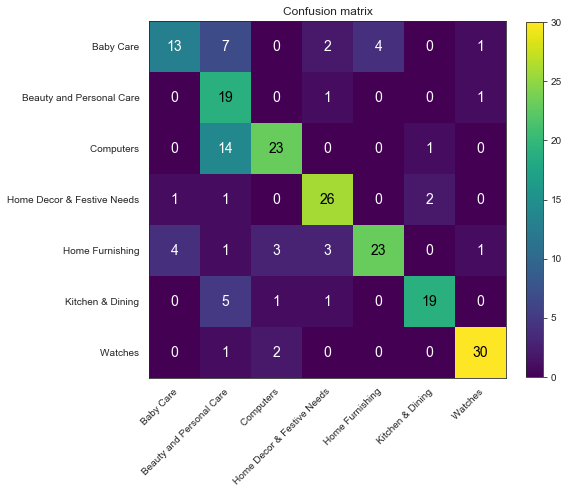

In [147]:
test_labels = np.argmax(y_test, axis=1)

plot_confusion_matrix(test_labels, labels, classes= classes,title='Confusion matrix')

### 2. Entrainement du modèle ResNet50

In [214]:
from keras.applications import ResNet50
from keras.applications.resnet50 import preprocess_input

In [215]:
train_datagen = ImageDataGenerator(
    rescale=1./255,
    preprocessing_function=preprocess_input,
    #rotation_range=90,
    #shear_range=45.0,
    brightness_range=[0.7,1.3], 
    horizontal_flip=True,
    vertical_flip=True
)

test_datagen = ImageDataGenerator(rescale=1./255,
                                 preprocessing_function=preprocess_input)

In [216]:
train_generator = train_datagen.flow(X_train, y_train)
test_generator = test_datagen.flow(X_test, y_test)

In [217]:
model = ResNet50(weights="imagenet", include_top=False, input_shape=(224, 224, 3))

model.summary()

C:\ProgramData\Anaconda3\lib\site-packages\keras_applications\resnet50.py:265: UserWarning: The output shape of `ResNet50(include_top=False)` has been changed since Keras 2.2.0.
  warnings.warn('The output shape of `ResNet50(include_top=False)` '


Model: "resnet50"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_13 (InputLayer)           (None, 224, 224, 3)  0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (None, 230, 230, 3)  0           input_13[0][0]                   
__________________________________________________________________________________________________
conv1 (Conv2D)                  (None, 112, 112, 64) 9472        conv1_pad[0][0]                  
__________________________________________________________________________________________________
bn_conv1 (BatchNormalization)   (None, 112, 112, 64) 256         conv1[0][0]                      
___________________________________________________________________________________________

In [218]:
for layer in model.layers:
    layer.trainable = False
    
for layer in model.layers:
    print(layer, layer.trainable)

<keras.engine.input_layer.InputLayer object at 0x0000022FF42D0320> False
<keras.layers.convolutional.ZeroPadding2D object at 0x0000022FAC617DA0> False
<keras.layers.convolutional.Conv2D object at 0x0000022FAC617828> False
<keras.layers.normalization.BatchNormalization object at 0x0000023005D11E80> False
<keras.layers.core.Activation object at 0x0000023005D11CC0> False
<keras.layers.convolutional.ZeroPadding2D object at 0x0000022FE48E89E8> False
<keras.layers.pooling.MaxPooling2D object at 0x0000022FE48E8C88> False
<keras.layers.convolutional.Conv2D object at 0x0000023005D2E240> False
<keras.layers.normalization.BatchNormalization object at 0x0000022FE4959208> False
<keras.layers.core.Activation object at 0x0000022FE4959C18> False
<keras.layers.convolutional.Conv2D object at 0x0000022FE4A44748> False
<keras.layers.normalization.BatchNormalization object at 0x0000022FE49C1A20> False
<keras.layers.core.Activation object at 0x0000022FE4A64F98> False
<keras.layers.convolutional.Conv2D objec

In [219]:
new_model = Sequential()

new_model.add(model)

new_model.add(Flatten())
new_model.add(Dense(12,activation='relu'))
new_model.add(Dropout(0.25))
new_model.add(Dense(encoder.categories_[0].shape[0],activation='softmax'))

new_model.summary()

Model: "sequential_17"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
resnet50 (Model)             (None, 7, 7, 2048)        23587712  
_________________________________________________________________
flatten_13 (Flatten)         (None, 100352)            0         
_________________________________________________________________
dense_27 (Dense)             (None, 12)                1204236   
_________________________________________________________________
dropout_23 (Dropout)         (None, 12)                0         
_________________________________________________________________
dense_28 (Dense)             (None, 7)                 91        
Total params: 24,792,039
Trainable params: 1,204,327
Non-trainable params: 23,587,712
_________________________________________________________________


In [220]:
new_model.compile(loss='categorical_crossentropy',optimizer=optimizers.RMSprop(lr=1e-4),metrics=['accuracy'])

history = new_model.fit_generator(
    train_generator,
    epochs=50,
    steps_per_epoch=X_train.shape[0] // 32,
    verbose=1, 
    validation_data=test_generator)

Epoch 1/50
26/26 [==============================] - 116s 4s/step - loss: 1.8575 - accuracy: 0.2649 - val_loss: 1.9793 - val_accuracy: 0.1667
Epoch 2/50
26/26 [==============================] - 113s 4s/step - loss: 1.4450 - accuracy: 0.4295 - val_loss: 2.4154 - val_accuracy: 0.1810
Epoch 3/50
26/26 [==============================] - 112s 4s/step - loss: 1.2437 - accuracy: 0.4963 - val_loss: 2.1482 - val_accuracy: 0.1810
Epoch 4/50
26/26 [==============================] - 113s 4s/step - loss: 1.2215 - accuracy: 0.5334 - val_loss: 2.4921 - val_accuracy: 0.1810
Epoch 5/50
26/26 [==============================] - 111s 4s/step - loss: 0.9932 - accuracy: 0.6015 - val_loss: 2.4650 - val_accuracy: 0.1810
Epoch 6/50
26/26 [==============================] - 114s 4s/step - loss: 0.9637 - accuracy: 0.6322 - val_loss: 3.0611 - val_accuracy: 0.1810
Epoch 7/50
26/26 [==============================] - 109s 4s/step - loss: 0.8873 - accuracy: 0.6747 - val_loss: 3.0874 - val_accuracy: 0.1810
Epoch 8/50
26

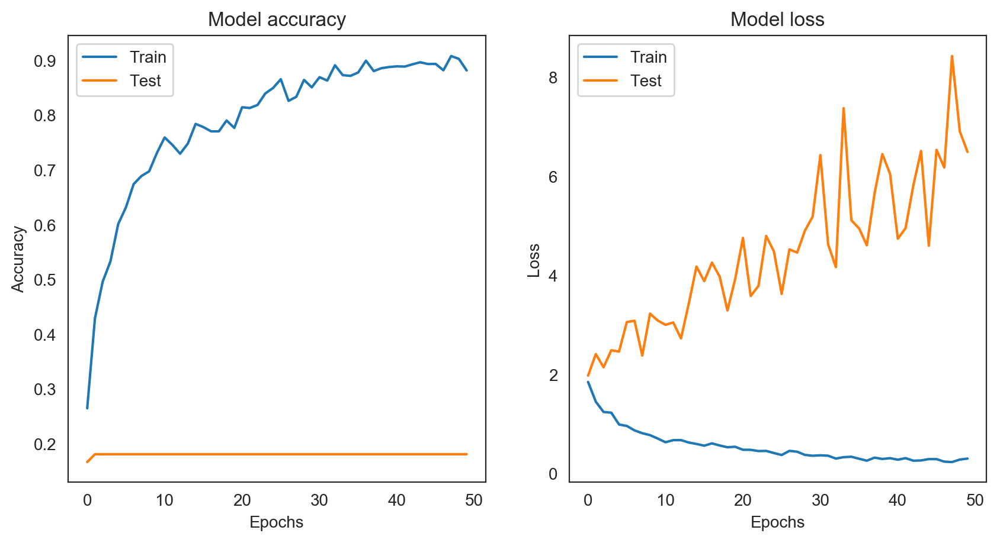

In [221]:
fig = plt.figure(figsize=(10, 5), dpi = 200, facecolor='w', edgecolor='k')

ax1 = plt.subplot(1,2,1)
ax1.plot(history.history['accuracy'])
ax1.plot(history.history['val_accuracy'])

ax1.set(title='Model accuracy')
ax1.set_ylabel('Accuracy')
ax1.set_xlabel('Epochs')
ax1.legend(['Train', 'Test'], loc='upper left')

ax2 = plt.subplot(1,2,2)
ax2.plot(history.history['loss'])
ax2.plot(history.history['val_loss'])

ax2.set(title='Model loss')
ax2.set_ylabel('Loss')
ax2.set_xlabel('Epochs')
ax2.legend(['Train', 'Test'], loc='upper left')

plt.show()

In [222]:
new_model.evaluate(test_generator)

7/7 [==============================] - 27s 4s/step


[6.120389938354492, 0.18095238506793976]

In [223]:
labels = new_model.predict_classes(X_test)
proba = new_model.predict_proba(X_test)

In [224]:
X_embedded = TSNE(n_components=2).fit_transform(proba)
X_embedded.shape

(210, 2)

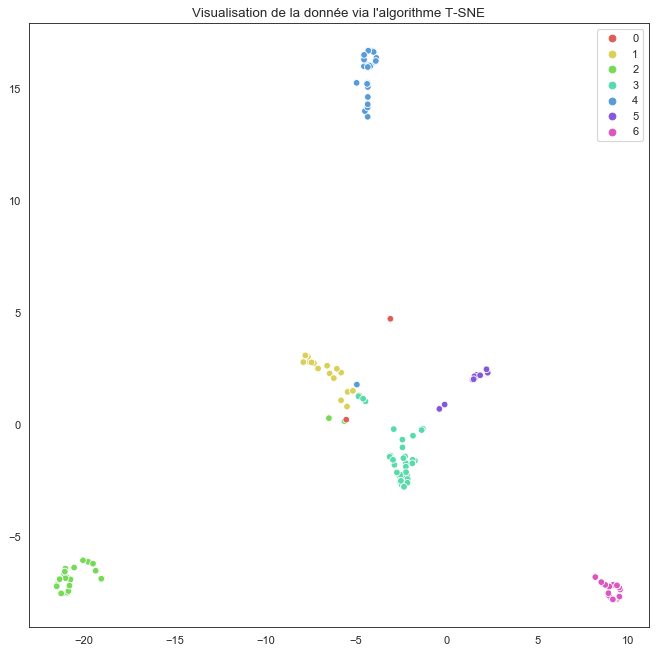

In [225]:
fig,ax = plt.subplots(figsize=(10, 10), dpi= 80, facecolor='w', edgecolor='k')

plt.title("Visualisation de la donnée via l'algorithme T-SNE")
g = sns.scatterplot(X_embedded[:,0], X_embedded[:,1],
                    hue=labels,
                    palette=sns.color_palette("hls", n_colors=len(np.unique(labels))))

plt.show()

Confusion matrix, without normalization
[[ 8  4  1  7  5  2  0]
 [ 0 18  1  1  1  0  0]
 [ 0  0 35  2  1  0  0]
 [ 0  3  1 22  2  1  1]
 [ 1  2  0  1 30  1  0]
 [ 0  3  1  2  0 20  0]
 [ 0  1  1  3  0  0 28]]


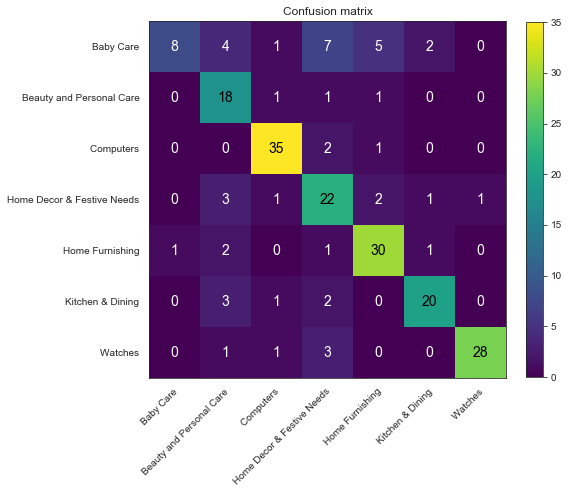

In [226]:
test_labels = np.argmax(y_test, axis=1)

plot_confusion_matrix(test_labels, labels, classes= classes,title='Confusion matrix')

### 3. Entrainement du modèle InceptionV3

In [227]:
from keras.applications.inception_v3 import InceptionV3

In [228]:
image_list = get_images_list_2('data/Images/',data['image'],299)
im_shape = image_list[0].shape

X = np.vstack([i.reshape(1,im_shape[0],im_shape[1],im_shape[2]) for i in image_list])
X_train, X_test, y_train, y_test = train_test_split(X,y_encode.todense(),test_size=0.2,random_state=42)

C:\ProgramData\Anaconda3\lib\site-packages\PIL\Image.py:2575: DecompressionBombWarning: Image size (93680328 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  DecompressionBombWarning)


In [229]:
train_datagen = ImageDataGenerator(
    rescale=1./255,
    #rotation_range=90,
    #shear_range=45.0,
    brightness_range=[0.7,1.3], 
    #horizontal_flip=True,
    #vertical_flip=True
)

test_datagen = ImageDataGenerator(rescale=1./255)

In [230]:
train_generator = train_datagen.flow(X_train, y_train)
test_generator = test_datagen.flow(X_test, y_test)

In [231]:
model = InceptionV3(weights="imagenet", include_top=False, input_shape=(299, 299, 3))

model.summary()

87916544/87910968 [==============================] - 865s 10us/step
Model: "inception_v3"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_14 (InputLayer)           (None, 299, 299, 3)  0                                            
__________________________________________________________________________________________________
conv2d_25 (Conv2D)              (None, 149, 149, 32) 864         input_14[0][0]                   
__________________________________________________________________________________________________
batch_normalization_1 (BatchNor (None, 149, 149, 32) 96          conv2d_25[0][0]                  
__________________________________________________________________________________________________
activation_491 (Activation)     (None, 149, 149, 32) 0           batch_normalization_1[0][0]      
___________________

In [232]:
for layer in model.layers:
    layer.trainable = False
    
for layer in model.layers:
    print(layer, layer.trainable)

<keras.engine.input_layer.InputLayer object at 0x0000022FF94C3160> False
<keras.layers.convolutional.Conv2D object at 0x0000023006EA7278> False
<keras.layers.normalization.BatchNormalization object at 0x0000022FF94B0390> False
<keras.layers.core.Activation object at 0x0000022FF94B0EF0> False
<keras.layers.convolutional.Conv2D object at 0x0000023006EA7B70> False
<keras.layers.normalization.BatchNormalization object at 0x000002300FAA4CC0> False
<keras.layers.core.Activation object at 0x0000023006EA7630> False
<keras.layers.convolutional.Conv2D object at 0x0000022EE8C5DF28> False
<keras.layers.normalization.BatchNormalization object at 0x0000022EE8C98FD0> False
<keras.layers.core.Activation object at 0x0000022EE8CB9470> False
<keras.layers.pooling.MaxPooling2D object at 0x0000022EE8D687B8> False
<keras.layers.convolutional.Conv2D object at 0x0000022EE8D4A320> False
<keras.layers.normalization.BatchNormalization object at 0x0000022EE8E1AD68> False
<keras.layers.core.Activation object at 0x

<keras.layers.convolutional.Conv2D object at 0x0000022EEDF1F208> False
<keras.layers.normalization.BatchNormalization object at 0x0000022EED800F98> False
<keras.layers.core.Activation object at 0x0000022EED9A41D0> False
<keras.layers.core.Activation object at 0x0000022EEDAB6B38> False
<keras.layers.core.Activation object at 0x0000022EEDD905F8> False
<keras.layers.core.Activation object at 0x0000022EEDEC7AC8> False
<keras.layers.normalization.BatchNormalization object at 0x0000022EEE00BDD8> False
<keras.layers.core.Activation object at 0x0000022EED83AFD0> False
<keras.layers.merge.Concatenate object at 0x0000022EEDA96E48> False
<keras.layers.merge.Concatenate object at 0x0000022EEDF9F5C0> False
<keras.layers.core.Activation object at 0x0000022EEDFF0F28> False
<keras.layers.merge.Concatenate object at 0x0000022EEDF73198> False


In [233]:
new_model = Sequential()

new_model.add(model)

new_model.add(Flatten())
new_model.add(Dense(12,activation='relu'))
new_model.add(Dropout(0.25))
new_model.add(Dense(encoder.categories_[0].shape[0],activation='softmax'))

new_model.summary()

Model: "sequential_18"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
inception_v3 (Model)         (None, 8, 8, 2048)        21802784  
_________________________________________________________________
flatten_14 (Flatten)         (None, 131072)            0         
_________________________________________________________________
dense_29 (Dense)             (None, 12)                1572876   
_________________________________________________________________
dropout_24 (Dropout)         (None, 12)                0         
_________________________________________________________________
dense_30 (Dense)             (None, 7)                 91        
Total params: 23,375,751
Trainable params: 1,572,967
Non-trainable params: 21,802,784
_________________________________________________________________


In [234]:
new_model.compile(loss='categorical_crossentropy',optimizer=optimizers.RMSprop(lr=1e-4),metrics=['accuracy'])

history = new_model.fit_generator(
    train_generator,
    epochs=50,
    steps_per_epoch=X_train.shape[0] // 32,
    verbose=1, 
    validation_data=test_generator)

Epoch 1/50
26/26 [==============================] - 122s 5s/step - loss: 2.0231 - accuracy: 0.1460 - val_loss: 1.9110 - val_accuracy: 0.1857
Epoch 2/50
26/26 [==============================] - 116s 4s/step - loss: 1.7183 - accuracy: 0.2389 - val_loss: 1.2480 - val_accuracy: 0.4619
Epoch 3/50
26/26 [==============================] - 116s 4s/step - loss: 1.4185 - accuracy: 0.3738 - val_loss: 1.5178 - val_accuracy: 0.5000
Epoch 4/50
26/26 [==============================] - 116s 4s/step - loss: 1.3530 - accuracy: 0.3960 - val_loss: 1.3455 - val_accuracy: 0.3810
Epoch 5/50
26/26 [==============================] - 117s 5s/step - loss: 1.2621 - accuracy: 0.4233 - val_loss: 1.1323 - val_accuracy: 0.5667
Epoch 6/50
26/26 [==============================] - 115s 4s/step - loss: 1.1720 - accuracy: 0.4629 - val_loss: 1.1507 - val_accuracy: 0.5286
Epoch 7/50
26/26 [==============================] - 116s 4s/step - loss: 1.1829 - accuracy: 0.4653 - val_loss: 1.1351 - val_accuracy: 0.4810
Epoch 8/50
26

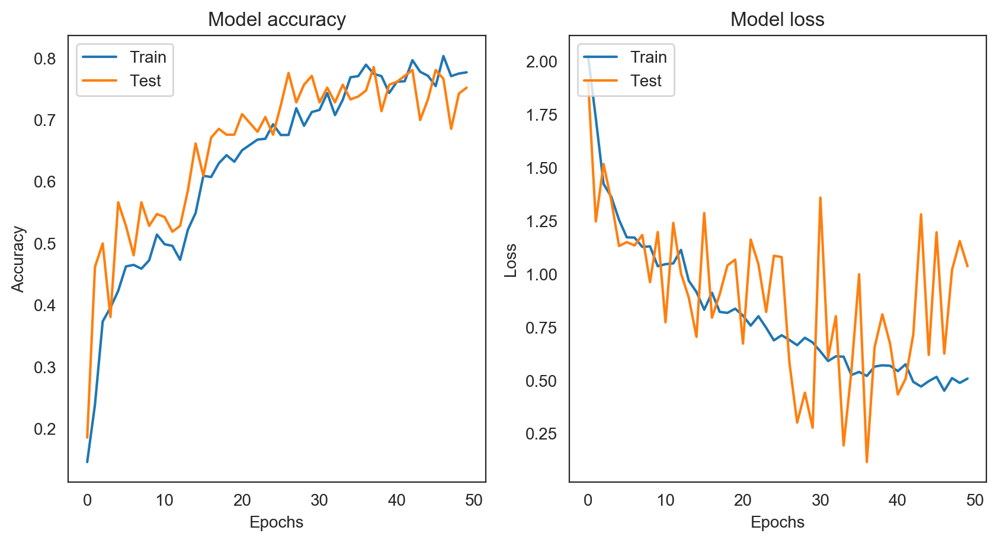

In [235]:
fig = plt.figure(figsize=(10, 5), dpi = 200, facecolor='w', edgecolor='k')

ax1 = plt.subplot(1,2,1)
ax1.plot(history.history['accuracy'])
ax1.plot(history.history['val_accuracy'])

ax1.set(title='Model accuracy')
ax1.set_ylabel('Accuracy')
ax1.set_xlabel('Epochs')
ax1.legend(['Train', 'Test'], loc='upper left')

ax2 = plt.subplot(1,2,2)
ax2.plot(history.history['loss'])
ax2.plot(history.history['val_loss'])

ax2.set(title='Model loss')
ax2.set_ylabel('Loss')
ax2.set_xlabel('Epochs')
ax2.legend(['Train', 'Test'], loc='upper left')

plt.show()

In [236]:
new_model.evaluate(test_generator)

7/7 [==============================] - 26s 4s/step


[1.2444475889205933, 0.7523809671401978]

In [237]:
labels = new_model.predict_classes(X_test)
proba = new_model.predict_proba(X_test)

In [238]:
X_embedded = TSNE(n_components=2).fit_transform(proba)
X_embedded.shape

(210, 2)

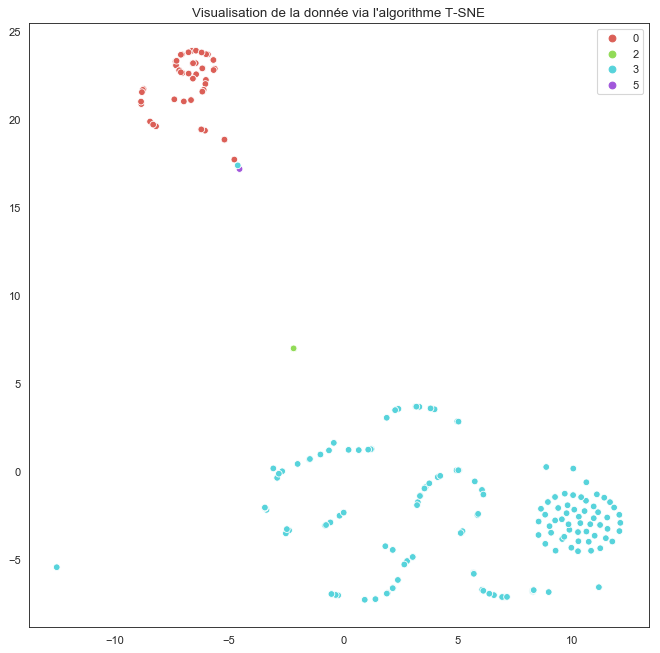

In [239]:
fig,ax = plt.subplots(figsize=(10, 10), dpi= 80, facecolor='w', edgecolor='k')

plt.title("Visualisation de la donnée via l'algorithme T-SNE")
g = sns.scatterplot(X_embedded[:,0], X_embedded[:,1],
                    hue=labels,
                    palette=sns.color_palette("hls", n_colors=len(np.unique(labels))))

plt.show()

Confusion matrix, without normalization
[[ 4  0  0 23  0  0  0]
 [ 6  0  0 15  0  0  0]
 [12  0  0 26  0  0  0]
 [ 8  0  1 21  0  0  0]
 [ 9  0  2 23  0  1  0]
 [ 8  0  1 17  0  0  0]
 [ 2  0  2 29  0  0  0]]


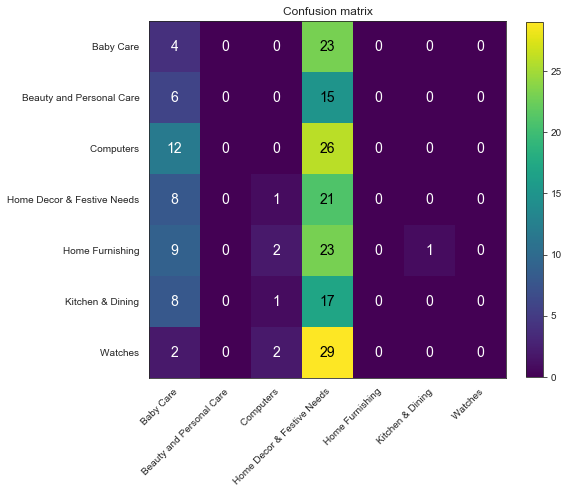

In [240]:
test_labels = np.argmax(y_test, axis=1)

plot_confusion_matrix(test_labels, labels, classes= classes,title='Confusion matrix')